### <b>Install the required libraries</b>

In [1]:
#Install the transformers library (Allows importing models from Hugging Face)
!pip install transformers
!pip install datasets 

### <b>Import necessary libraries</b>

In [2]:
import copy 
import json
import logging 
import os 

import warnings
warnings.filterwarnings("ignore")
import logging
logging.basicConfig(level=logging.ERROR)

import numpy as np
import pandas as pd
from datasets import load_dataset
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch

In [3]:
# Check if CUDA is available
print("CUDA Available:", torch.cuda.is_available())

# If CUDA is available, print the current GPU details
if torch.cuda.is_available():
    print("Current GPU Index:", torch.cuda.current_device())
    print("Current GPU Name:", torch.cuda.get_device_name(torch.cuda.current_device()))
    print("GPU Memory Allocated:", torch.cuda.memory_allocated())
    print("GPU Memory Cached:", torch.cuda.memory_cached())

CUDA Available: True
Current GPU Index: 0
Current GPU Name: GeForce RTX 2080 Ti
GPU Memory Allocated: 0
GPU Memory Cached: 0


### <b>Load the model from Hugging Face's model hub</b>

In [4]:
import transformers
from transformers import AutoConfig, AutoModelForSequenceClassification, AutoTokenizer
from transformers import AdamW, get_linear_schedule_with_warmup
from transformers import BigBirdConfig, AutoConfig, AutoModel

In [5]:
from transformers import AutoModel, AutoTokenizer, BigBirdConfig

model_path = "snunlp/KR-Medium"
model = AutoModel.from_pretrained(model_path)

tokenizer = AutoTokenizer.from_pretrained(model_path, do_lower_case=False)

text = "한국어 KR-BERT 모델을 공개합니다!"
encoded_input = tokenizer(text, return_tensors='pt', truncation=True)
output = model(**encoded_input)

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


In [6]:
# Print the values of the final hidden state
print(output[0])

# Print the shape of the final hidden state
print(output[0].shape)

tensor([[[ 0.3643,  0.6459, -0.2313,  ...,  0.6451, -0.1159,  0.3841],
         [-0.0726,  1.3123,  0.5474,  ...,  1.5355,  0.4892,  0.2628],
         [-0.2217,  1.5919, -0.4332,  ...,  0.1309, -0.0770,  0.3442],
         ...,
         [-0.6567,  0.5202, -0.1853,  ...,  0.4653,  0.0383,  0.7940],
         [-0.0108,  0.5530, -0.1801,  ...,  0.4510, -0.4076,  0.3430],
         [ 0.1201,  0.7531, -0.3095,  ...,  0.6505,  0.5646,  0.0246]]],
       grad_fn=<NativeLayerNormBackward0>)
torch.Size([1, 16, 768])


### <b>Set hyperparameters for the experiment</b>

In [7]:
from types import SimpleNamespace

# Create a configuration object to store hyperparameters and other settings
config = SimpleNamespace()

config.task = "krbert_multi"
config.dataset = "KoMultiText"

config.cache_dir = "krbert_multi_cache" # Temporary directory for current task assets like vocabulary
config.output_dir = "krbert_multi_output" # Directory where final models and results will be saved

config.use_tpu = False
config.model_name_or_path = model_path 
config.data_dir = "./" # The input data dir 

config.train_file = "train_dataset.csv" 
config.predict_file = "test_dataset.csv" 

config.max_seq_length = 512 # Maximum sequence length
config.train_batch_size = 8 # Batch size for training
config.eval_batch_size = 4 # Batch size for evaluation

config.learning_rate = 3e-6 # The initial learning rate for Adam
config.num_train_epochs = 20 # Total number of training epochs to perform

config.gradient_accumulation_steps = 4 # Number of updates steps to accumulate before performing a backward/update pass.
config.threads = 4
config.seed = 42 

config.device_num = 0 # Device number (changable for multi-GPU setups)

config.do_train = True 
config.do_eval_during_train = True
config.do_eval = True 

config.do_lower_case = False
config.weight_decay = 0.0 # Weight decay if we apply some.
config.adam_epsilon = 1e-8 # Epsilon for Adam optimizer.
config.max_grad_norm = 1.0 # Max gradient norm.
config.warmup_proportion = 0.0 # Warmup proportion for linear warmup

### <b>Preprocessing the training dataset</b>
* Instead of tokenizing the training text every time, we preprocess and <b>save all tokenized results before starting the model training</b>.
    * This approach significantly speeds up the process.

In [8]:
tokenizer = AutoTokenizer.from_pretrained(config.model_name_or_path, do_lower_case=False, cache_dir=config.cache_dir)

In [9]:
def train_split(config, texts, labels, is_train):
    
    x_train, y_train, x_label, y_label = train_test_split(
        texts, labels, test_size=0.2, random_state=config.seed, stratify=None
    )
    if is_train:
        texts, labels = x_train, x_label
    else:
        texts, labels = y_train, y_label
        
    return texts, labels

def process_comment_cls(config, data_file, is_train):
    
    df = pd.read_csv(data_file)
    df = df[df["preference"]!= -1] # Exclude rows where preference is -1
    
    # Convert columns to lists for processing
    preferences = df["preference"].astype(int).values.tolist()
    profanities = df["profanity"].astype(int).values.tolist()
    genders = df["gender"].astype(int).values.tolist()
    politics = df["politics"].astype(int).values.tolist()
    nations = df["nation"].astype(int).values.tolist()
    races = df["race"].astype(int).values.tolist()
    regions = df["region"].astype(int).values.tolist()
    generations= df["generation"].astype(int).values.tolist()
    social_clss = df["social hierarchy"].astype(int).values.tolist()
    appearances = df["appearance"].astype(int).values.tolist()
    others = df["others"].astype(int).values.tolist()
    
     # Create a combined label list
    labels = []
    for i in range(len(preferences)):
        preference = preferences[i] 
        profanity = profanities[i] 
        gender = genders[i] 
        politic = politics[i] 
        nation = nations[i]
        race = races[i]
        region = regions[i]
        generation = generations[i]
        social_cls = social_clss[i]
        appearance = appearances[i]
        other = others[i]
        labels.append([preference, profanity, gender, politic, nation, race, region, generation, social_cls, appearance, other])
        
    texts = df["comment"].astype(str).values.tolist()
    texts, labels = train_split(config, texts, labels, is_train) # Split the data
    
    return texts, labels

In [10]:
import torch.utils.data as torch_data

def data_pretokenizing(config, tokenizer, is_train=True):
    
    if is_train:
        data_file = config.train_file
    else:
        data_file = config.predict_file

    data_path = config.data_dir
    if data_file is not None:
        data_path = os.path.join(data_path, data_file)
    else:
        data_path += "/"

    # Construct the file name for the tokenized dataset
    comps = [
        data_path,
        config.dataset,
        config.model_name_or_path.replace("/", "_"),
        config.max_seq_length,
        "train" if is_train else "dev",
        "dataset.txt",
    ]
    dataset_file = "_".join([str(comp) for comp in comps])
    print("dataset_file:", dataset_file)

    # Tokenize the dataset and write to the file
    with open(dataset_file, "w", encoding="utf-8") as writer_file:
        cnt = 0
        total_data = process_comment_cls(config, data_path, is_train)
        for text, label in zip(total_data[0], total_data[1]):
            feature = tokenizer(text, max_length=config.max_seq_length, padding="max_length", truncation=True, add_special_tokens=True)
            writed_data = {
                "input_ids": feature["input_ids"],
                "attention_mask": feature["attention_mask"],
                "preference": int(label[0]), 
                "profanity": int(label[1]),
                "gender": int(label[2]),
                "politic": int(label[3]), 
                "nation" : int(label[4]),
                "race" : int(label[5]),
                "region" : int(label[6]),
                "generation" : int(label[7]),
                "social_cls" : int(label[8]),
                "appearance" : int(label[9]),
                "other": int(label[10]),
            }
            writer_file.write(json.dumps(writed_data) + "\n")
            cnt += 1
        print(f"{cnt} features processed from {data_path}")

    return dataset_file

In [11]:
if config.do_train:
    # Preprocess the training dataset
    train_dataset_file = data_pretokenizing(config, tokenizer=tokenizer)

# Preprocess the evaluation dataset (evaluation is equivalent to 'dev' or 'validation')
predict_dataset_file = data_pretokenizing(config, tokenizer=tokenizer, is_train=False)

dataset_file: ./train_dataset.csv_KoMultiText_snunlp_KR-Medium_512_train_dataset.txt
30688 features processed from ./train_dataset.csv
dataset_file: ./test_dataset.csv_KoMultiText_snunlp_KR-Medium_512_dev_dataset.txt
400 features processed from ./test_dataset.csv


### <b>Initialize the data loader</b>

In [12]:
class IterableDatasetPad(torch.utils.data.IterableDataset):
    def __init__(
        self,
        dataset: torch.utils.data.IterableDataset,
        batch_size: int = 1,
        num_devices: int = 1,
        seed: int = 0,
    ):
        self.dataset = dataset
        self.batch_size = batch_size
        self.seed = seed
        self.num_examples = 0

        chunk_size = self.batch_size * num_devices
        length = len(dataset)
        self.length = length + (chunk_size - length % chunk_size)

    def __len__(self):
        return self.length

    def __iter__(self):
        self.num_examples = 0
        # If dataset has a set epoch method, set the manual seed for reproducibility
        if (
            not hasattr(self.dataset, "set_epoch")
            and hasattr(self.dataset, "generator")
            and isinstance(self.dataset.generator, torch.Generator)
        ):
            self.dataset.generator.manual_seed(self.seed + self.epoch)

        first_batch = None
        current_batch = []
        for element in self.dataset:
            self.num_examples += 1
            current_batch.append(element)
            # Yield the current batch once it's full
            if len(current_batch) == self.batch_size:
                for batch in current_batch:
                    yield batch
                    if first_batch is None:
                        first_batch = batch.copy()
                current_batch = []
                
        # Pad the last batch if it's smaller than the batch size
        while self.num_examples < self.length:
            add_num = self.batch_size - len(current_batch)
            self.num_examples += add_num
            current_batch += [first_batch] * add_num
            for batch in current_batch:
                yield batch
            current_batch = []

In [13]:
def collate_fn(features):
    
    # Extracting individual features from samples
    input_ids = [sample["input_ids"] for sample in features]
    attention_mask = [sample["attention_mask"] for sample in features]
    
    preference = [sample["preference"] for sample in features]
    profanity = [sample["profanity"] for sample in features]
    gender = [sample["gender"] for sample in features]
    politic = [sample["politic"] for sample in features]
    nation = [sample["nation"] for sample in features]
    race = [sample["race"] for sample in features]
    region = [sample["region"] for sample in features]
    generation = [sample["generation"] for sample in features]
    social_cls = [sample["social_cls"] for sample in features]
    appearance = [sample["appearance"] for sample in features]
    other = [sample["other"] for sample in features]
    
    # Convert lists to tensors
    input_ids = torch.tensor(np.array(input_ids).astype(np.int64), dtype=torch.long)
    attention_mask = torch.tensor(np.array(attention_mask).astype(np.int8), dtype=torch.long)
    
    preference = torch.tensor(np.array(preference).astype(np.int64), dtype=torch.long)
    profanity = torch.tensor(np.array(profanity).astype(np.int64), dtype=torch.float)
    gender = torch.tensor(np.array(gender).astype(np.int64), dtype=torch.float)
    politic = torch.tensor(np.array(politic).astype(np.int64), dtype=torch.float)
    nation = torch.tensor(np.array(nation).astype(np.int64), dtype=torch.float)
    race = torch.tensor(np.array(race).astype(np.int64), dtype=torch.float)
    region = torch.tensor(np.array(region).astype(np.int64), dtype=torch.float)
    generation = torch.tensor(np.array(generation).astype(np.int64), dtype=torch.float)
    social_cls = torch.tensor(np.array(social_cls).astype(np.int64), dtype=torch.float)
    appearance = torch.tensor(np.array(appearance).astype(np.int64), dtype=torch.float)
    other = torch.tensor(np.array(other).astype(np.int64), dtype=torch.float)
    
    inputs = {
        "input_ids": input_ids,
        "attention_mask": attention_mask,
    }
    labels = {
        "preference": preference,
        "profanity": profanity,
        "gender" : gender,
        "politic": politic,
        "nation" :nation, 
        "race" : race,
        "region" : region,
        "generation" : generation,
        "social_cls" : social_cls,
        "appearance" : appearance,
        "other" : other,
    }
    
    return inputs, labels

In [14]:
# If in training mode, prepare training data
if config.do_train:
    
    # Load dataset from file and parse JSON entries
    train_dataset = load_dataset("text", data_files=train_dataset_file, download_mode="force_redownload")["train"]
    train_dataset = train_dataset.map(lambda x: json.loads(x["text"]), batched=False)
    
    # Create data loader for training
    train_dataloader = torch_data.DataLoader(
        train_dataset,
        sampler=torch_data.RandomSampler(train_dataset),
        drop_last=False,
        batch_size=config.train_batch_size,
        collate_fn=(collate_fn),
    )

# Prepare the evaluation (prediction) data
predict_dataset = load_dataset("text", data_files=predict_dataset_file, download_mode="force_redownload")["train"]
predict_dataset = predict_dataset.map(lambda x: json.loads(x["text"]), batched=False)

# Pad the dataset to make it evenly divisible by the batch size
predict_dataset = IterableDatasetPad(
    dataset=predict_dataset,
    batch_size=config.eval_batch_size,
    num_devices=1,
    seed=config.seed,
)

# Create data loader for prediction
predict_dataloader = torch_data.DataLoader(
    predict_dataset,
    sampler=None,
    drop_last=False,
    batch_size=config.eval_batch_size,
    collate_fn=(collate_fn),
)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-b67ac8ec0bccdbba/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/30688 [00:00<?, ? examples/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-aeb0211247df16ff/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/400 [00:00<?, ? examples/s]

### <b>Define the text classification model</b>

In [15]:
from transformers import AutoModel
import torch.nn as nn

class ClsModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        data_file = os.path.join(config.data_dir, str(config.train_file)) 
        model_config = AutoConfig.from_pretrained(config.model_name_or_path, num_labels=5)
        self.model = AutoModel.from_pretrained(
            config.model_name_or_path, config=model_config, cache_dir=config.cache_dir
        )

        # Initialize multiple classifiers (linear layers) for different tasks
        self.classifiers = nn.ModuleList([nn.Linear(768, size) for size in [5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])

        self.tokenizer = tokenizer

    def save_pretrained(self, save_dir):
        self.model.save_pretrained(save_dir)
        # Remove unnecessary keys from the tokenizer's init_kwargs
        for key in ["special_tokens_map_file", "tokenizer_file"]:
            self.tokenizer.init_kwargs.pop(key, None)
        self.tokenizer.save_pretrained(save_dir)

    def get_optimizer(self): 
        # Specify parameters that should not undergo weight decay during training
        no_decay = ["bias", "LayerNorm.weight"]
        # Group model parameters based on whether they should have weight decay or not
        optimizer_grouped_parameters = [
            {
                "params": [p for n, p in self.model.named_parameters() if not any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
            {
                "params": [p for n, p in self.model.named_parameters() if any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
        ]
        
        optimizer = AdamW(optimizer_grouped_parameters, lr=config.learning_rate, eps=config.adam_epsilon)
        return optimizer

    def get_scheduler(self, batch_num, optimizer): 
        # If no warmup is needed, return None
        if config.warmup_proportion == 0.0:
            return None
        
        # Calculate the total number of training steps
        t_total = batch_num // config.gradient_accumulation_steps * config.num_train_epochs
        
        # Define the learning rate scheduler with a linear warmup phase
        scheduler = get_linear_schedule_with_warmup(
            optimizer,
            num_warmup_steps=int(t_total * config.warmup_proportion),
            num_training_steps=t_total,
        )

        return scheduler

    def forward(self, inputs):
        
        hidden = self.model(**inputs) # Get the model's hidden states
        # Extract [CLS] token from the last layer
        cls_token_embeddings = hidden.last_hidden_state[:,0,:]  # [batch_size, 768]
        
        # Get outputs for each task using the respective classifier
        outputs = [classifier(cls_token_embeddings) for classifier in self.classifiers]
        
        return outputs
    
    def eval_step(self, inputs, labels, outputs):
        
        label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
        results = {}
        
        # Process the first output (softmax for multiple classes)
        logits_1 = outputs[0].detach().cpu()
        probabilities = torch.nn.functional.softmax(logits_1, dim=1)
        results["results_1"] = [{"prediction": pred, "label": label, "prob": prob} for pred, label, prob in zip(self.tensor_to_list(torch.argmax(logits_1, dim=-1)), self.tensor_to_list(labels["preference"]), probabilities)]
        
        # Process the other outputs (sigmoid for binary classification)
        for idx, key in enumerate(label_keys[1:], 2):
            logits = outputs[idx-1].detach().cpu()
            threshold = 0.5
            predictions = self.tensor_to_list((torch.sigmoid(logits) > threshold).int())
            results[f"results_{idx}"] = [{"prediction": prediction, "label": label, "prob": torch.sigmoid(prob).item()} for prediction, label, prob in zip(predictions, self.tensor_to_list(labels[key]), logits)]
        
        return results

    def tensor_to_array(self, tensor):
        return tensor.detach().cpu().numpy()
    
    def tensor_to_list(self, tensor):
        return self.tensor_to_array(tensor).tolist()

In [16]:
# Set the random seed for reproducibility in both numpy and PyTorch
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

# Calculate the running average of the loss using a decay factor
def cal_running_avg_loss(loss, running_avg_loss, decay=0.99):
    if running_avg_loss == 0:
        return loss
    running_avg_loss = running_avg_loss * decay + (1 - decay) * loss
    return running_avg_loss

### <b>Define the functions for training and evaluation</b>

In [17]:
from functools import partial
import sklearn.metrics as sklearn_metrics
from sklearn.metrics import mean_absolute_error, f1_score, precision_recall_curve, auc, roc_curve
import matplotlib.pyplot as plt

category_map = {
    1: "preference",
    2: "profanity",
    3: "gender",
    4: "politics",
    5: "nation",
    6: "race",
    7: "region",
    8: "generation",
    9: "social hierarchy",
    10: "appearance",
    11: "others"
}

# Metrics for binary-classification
binary_metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "precision": sklearn_metrics.precision_score,
    "recall": sklearn_metrics.recall_score,
    "f1": sklearn_metrics.f1_score,
    "matthews_corrcoef": sklearn_metrics.matthews_corrcoef,
}

# Metrics for multi-classification
metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "f1-macro": partial(sklearn_metrics.f1_score, average="macro"),
}   

# Function to compute top 2 accuracy. 
# This considers a prediction as correct if the true label is among the top 2 predicted labels.
def top2_accuracy(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)

    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    match = (top_2_indices == torch.tensor(labels).view(-1, 1)).any(dim=1)
    return match.float().mean().item()

# Function to compute top 2 F1 score in a macro-average setting. 
# This treats each class independently then averages the F1 scores.
def top2_f1_macro(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)
    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    labels = np.array(labels)
    
    top_2_pred = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    for i, indices in enumerate(top_2_indices):
        top_2_pred[i, indices] = 1

    y_true = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    y_true[np.arange(len(labels)), labels] = 1
    
    return f1_score(y_true, top_2_pred, average='macro')

# Function to calculate the area under the Precision-Recall curve.
def calculate_pr_auc(labels, prob):
    precision, recall, _ = precision_recall_curve(labels, prob)
    return auc(recall, precision)

# General function to plot either the ROC or Precision-Recall curve for multiple categories.
def plot_curve(labels_list, probs_list, category_names, epoch, curve_type="auroc", dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    for labels, probs, category_name in zip(labels_list, probs_list, category_names):
        if curve_type == "auroc":
            save_path = f"bias_auroc_{epoch}.png" 
            x, y, _ = roc_curve(labels, probs)
            metric = auc(x, y)
            xlabel, ylabel, title = 'False Positive Rate', 'True Positive Rate', 'ROC Curves for Bias Labels'
        else:
            save_path = f"bias_prroc_{epoch}.png"
            x, y, _ = precision_recall_curve(labels, probs)
            metric = auc(y, x)
            xlabel, ylabel, title = 'Recall', 'Precision', 'Precision-Recall Curves for Bias Labels'
        
        plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')

    if curve_type == "auroc":
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.title(title, fontsize=19)
    plt.legend(loc='lower right' if curve_type == "auroc" else 'lower left', fontsize=14)
    plt.tight_layout()
    plt.savefig(save_path, format='png', dpi=dpi)
    plt.show()

# Function dedicated to plot the ROC curve for the profanity category.
def plot_single_roc_curve(labels, probs, category_name, epoch, dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    x, y, _ = roc_curve(labels, probs)
    metric = auc(x, y)
    
    plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curve for Profanity Classification', fontsize=19)
    plt.legend(loc='lower right', fontsize=16)
    plt.tight_layout()
    plt.savefig(f"profanity_auroc_{epoch}.png", format='png', dpi=dpi)
    plt.show()

# Evaluate the performance of the model based on various metrics     
def eval_cls(all_results, all_probs, epoch, **kwargs):
    
    results_dict = {}
    labels_list = []
    probs_list = []
    category_names = []

    for i in range(11):
        results_i = all_results[i]
        probs_i = all_probs[i]
        
        # Extract predictions and ground truth labels for the current category.
        predictions = np.array([result["prediction"] for result in results_i])
        labels = np.array([result["label"] for result in results_i])
        
        # Use binary metrics for binary classification tasks and multi-class metrics for multi-class tasks.
        metric_funcs = binary_metrics if i > 0 else metrics
        # Compute and store each metric.
        results = {metric: round(f(labels, predictions) * 100, 2) for metric, f in metric_funcs.items()}
        
        # If it's a binary task, compute PR and ROC AUC metrics.
        if i > 0:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            results["pr_auc"] = calculate_pr_auc(labels, y_scores)
            results["roc_auc"] = sklearn_metrics.roc_auc_score(labels, y_scores)
            results_dict[f"pr_auc_{i+1}"] = results["pr_auc"]
            results_dict[f"roc_auc{i+1}"] = results["roc_auc"]
        
        # If the task is one of the bias categories, add labels and probabilities to the lists for plotting.
        if i > 1:
            labels_list.append(labels)
            probs = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            probs_list.append(probs)
            category_name = category_map.get(i+1, f"Category {i+1}")
            category_names.append(category_name)
        
         # Special computations for the Preference category.
        if i == 0:  # Preference category
            results_dict["pref_mae"] = mean_absolute_error(labels, predictions)
            results_dict["pref_top2_acc"] = top2_accuracy(labels, probs_i)
            results_dict["pref_top2_f1"] = top2_f1_macro(labels, probs_i)
        
        # If it's the Profanity category, plot the ROC curve.
        if i == 1:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            plot_single_roc_curve(labels, y_scores, category_map[i+1], epoch)

        results_dict[f"results_{i+1}"] = results
        
            
    # Plot the ROC and PRROC curves for all bias tasks (categories from 2 to 11).
    if len(labels_list) > 0:
        plot_curve(labels_list, probs_list, category_names, epoch)
        plot_curve(labels_list, probs_list, category_names,  epoch, curve_type="prroc")

    return results_dict

In [18]:
import torch
import torch.nn as nn
from tqdm import tqdm

def _run_epoch(model, loader, device=None, context=None, **kwargs):
    config = kwargs["config"]
    is_train = kwargs["is_train"]

    avg_loss = 0
    results = []
    batch_num = len(loader)
    
    total_class_counts = [0] * 5 
    correct_class_counts = [0] * 5
    
    # Initialize optimizer and scheduler if in training mode
    optimizer, scheduler = None, None
    if is_train:
        model.train()
        if config.use_tpu:
            optimizer = context.getattr_or("optimizer", lambda: model.get_optimizer())
            scheduler = context.getattr_or("scheduler", lambda: model.get_scheduler(batch_num, optimizer))
        else:
            optimizer = kwargs["optimizer"]
            scheduler = kwargs["scheduler"]
    else:
        model.eval()
    
    # ProgressBar setup
    is_master = True
    pbar = tqdm(enumerate(loader), total=batch_num, disable=not is_master, dynamic_ncols=True, position=0, leave=True)

    corrections = [0] * 11
    total = 0
    
    # Weighting for the class imbalance
    weights = torch.tensor([max([11, 31, 50, 6, 2]) / p for p in [11, 31, 50, 6, 2]]).float().to(device)
    label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
    weights_bias = [1, 10.0, 20.0]
    weights_final = [1, 1, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2]

    for i, (inputs, labels) in pbar:
        # Move tensors to device
        inputs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in inputs.items()}
        labels = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in labels.items()}

        outputs = model(inputs)

        # First loss: preference 
        loss_function_1 = nn.CrossEntropyLoss(weight=weights)
        loss_1 = loss_function_1(outputs[0], labels["preference"])
        predicted1 = torch.argmax(outputs[0], dim=1)
        corrections[0] += predicted1.eq(labels["preference"]).sum().item()
        for j in range(5):  
            mask = (labels["preference"] == j)
            correct_class_counts[j] += predicted1[mask].eq(labels["preference"][mask]).sum().item()
            total_class_counts[j] += mask.sum().item()

        # Subsequent losses
        total_losses = [loss_1]
        threshold, threshold2 = 0.5, 0.40
        for idx, key in enumerate(label_keys[1:], 2):
            if key == "profanity":
                loss_fn = nn.BCEWithLogitsLoss()
            else:
                weight_value = weights_bias[1 if key == "gender" else 2]
                loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight_value]).to(device))
            
            loss = loss_fn(outputs[idx-1].squeeze(1), labels[key])
            total_losses.append(loss)
            predicted = torch.sigmoid(outputs[idx-1].squeeze(1)) >= (threshold if key == "profanity" else threshold2)
            corrections[idx-1] += predicted.eq(labels[key]).sum().item()

        # Compute the total loss using the individual weights
        total_loss = sum(w * l for w, l in zip(weights_final, total_losses))
        avg_loss = cal_running_avg_loss(total_loss.item(), avg_loss)
        total_loss /= config.gradient_accumulation_steps

        if is_train:
            total_loss.backward()
            if i % config.gradient_accumulation_steps == 0 or i == batch_num - 1:
                if config.max_grad_norm > 0:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), config.max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()
                if scheduler is not None:
                    scheduler.step()
        else:
            result = (model.module if hasattr(model, "module") else model).eval_step(inputs, labels, outputs)
            results.append(result)
        
        # Update progress bar
        if is_master:
            pbar.set_description(f"epoch: {kwargs['epoch'] + 1}, {('train' if is_train else 'valid')} loss: {min(100, round(avg_loss, 4))}")
            
    class_accuracies = [correct / total if total != 0 else 0 for correct, total in zip(correct_class_counts, total_class_counts)]
    
    print("Preference Accuracy per class")
    for i, acc in enumerate(class_accuracies):
        print(f"Class {i+1}: {acc*100:.2f}%")
        
    return {"loss": avg_loss, "result": results}

# Wrapper to run the epoch either on CPU/GPU or TPUs
def run_epoch(**kwargs):
    model = kwargs.pop("model")
    if kwargs["config"].use_tpu:
        results = model(_run_epoch, **kwargs)
    else:
        results = _run_epoch(model, **kwargs)

    if isinstance(results, list):
        loss = sum([result["loss"] for result in results]) / len(results)
        result = [res["result"] for res in results]
        results = {"loss": loss, "result": result}

    return results

### <b>Model Initialization and Configuration</b>

In [19]:
import os
import torch

set_seed(config.seed) # Set the random seed for reproducibility

model = ClsModel() # Initialize the classification model
print(f"Configuration: {str(config)}")

# Check for available GPUs and set the model to run on GPU(s) if available
if torch.cuda.is_available():
    gpu_count = torch.cuda.device_count()
    print(f"{gpu_count} GPU device(s) detected")
    device_num = config.device_num
    devices = [device_num]
    # Use Data Parallelism if more than one GPU is available
    model_dp = torch.nn.DataParallel(model, device_ids=devices)
    model_dp.to(devices[0])  
else:
    devices = ["cpu"] # If no GPUs are available, use the CPU
    model_dp = model

# Create cache directory if it doesn't exist
if not os.path.exists(config.cache_dir):
    os.makedirs(config.cache_dir)

# Define and create the output directory
output_dir = os.path.join(config.output_dir, config.task, config.dataset)
print("Output directory:", output_dir)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize optimizer and scheduler if in training mode
optimizer = None
scheduler = None
if config.do_train:
    optimizer = model.get_optimizer()
    scheduler = model.get_scheduler(len(train_dataloader), optimizer)

# Bundle parameters for easy reference
params = {
    "config": config,
    "model": model_dp,
    "optimizer": optimizer,
    "scheduler": scheduler,
}
if not config.use_tpu:
    params["device"] = devices[0]

Configuration: namespace(task='krbert_multi', dataset='KoMultiText', cache_dir='krbert_multi_cache', output_dir='krbert_multi_output', use_tpu=False, model_name_or_path='snunlp/KR-Medium', data_dir='./', train_file='train_dataset.csv', predict_file='test_dataset.csv', max_seq_length=512, train_batch_size=8, eval_batch_size=4, learning_rate=3e-06, num_train_epochs=20, gradient_accumulation_steps=4, threads=4, seed=42, device_num=1, do_train=True, do_eval_during_train=True, do_eval=True, do_lower_case=False, weight_decay=0.0, adam_epsilon=1e-08, max_grad_norm=1.0, warmup_proportion=0.0)
4 GPU device(s) detected
Output directory: krbert_multi_output/krbert_multi/KoMultiText


### <b>Traning the model</b>

In [20]:
import os
import json
import copy
import torch

def do_eval(epoch):
    # No gradient computation during evaluation
    with torch.no_grad():
        # Run one epoch without training (inference only)
        results = run_epoch(loader=predict_dataloader, epoch=epoch, is_train=False, **params)["result"]
        
        # Group results by category
        all_results = [ [result_dict[f'results_{i}'] for result_dict in results] for i in range(1, 12) ]
        all_results = [ [item for sublist in result_list for item in sublist] for result_list in all_results ]
        
        # Extract probabilities from results
        probs = [ [result['prob'] for result in results] for results in all_results ]
        all_probs = []
        for p in probs:
            tensors = []
            for t in p:
                if isinstance(t, torch.Tensor):
                    tensors.append(t.view(1, -1))
                else:
                    tensors.append(torch.tensor([[t]]))
            all_probs.append(torch.cat(tensors))
        
        # Evaluate the model using the evaluation data
        eval_results = eval_cls(
            config=config,
            model=model,
            loader=predict_dataloader,
            tokenizer=model.tokenizer,
            all_results=all_results,
            all_probs=all_probs,
            epoch=epoch
        )
        
        category_labels = {
            1: "Preference",
            2: "Slang",
            3: "Gender",
            4: "Politic",
            5: "Nation",
            6: "Race",
            7: "Region",
            8: "Generation",
            9: "Social Class",
            10: "Appearance",
            11: "Other",
        }
        
        # Print evaluation results by category
        for i in range(1, 12):
            label_name = category_labels.get(i, f"Category {i}")
            print(f"\nEval results for {label_name}.")
            for k, v in eval_results[f"results_{i}"].items():
                print(f"{k} : {v}")
            if i == 1:
                print(f"preference_mae:{eval_results['pref_mae']}")
                print(f"preference_top2_accuracy:{eval_results['pref_top2_acc']}")
                print(f"preference_top2_f1:{eval_results['pref_top2_f1']}")
            
    return [eval_results[f"results_{i}"] for i in range(1, 12)] + [eval_results["pref_mae"], eval_results["pref_top2_acc"], eval_results["pref_top2_f1"]] + [eval_results[f"pr_auc_{i+1}"] for i in range(1, 11)]

epoch: 1, train loss: 8.4126: 100%|██████████████████████████████████████| 3836/3836 [22:13<00:00,  2.88it/s]


Preference Accuracy per class
Class 1: 50.63%
Class 2: 37.32%
Class 3: 56.21%
Class 4: 15.15%
Class 5: 17.45%


epoch: 1, valid loss: 11.3889: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 12.96it/s]


Preference Accuracy per class
Class 1: 76.83%
Class 2: 52.56%
Class 3: 47.52%
Class 4: 27.54%
Class 5: 22.97%


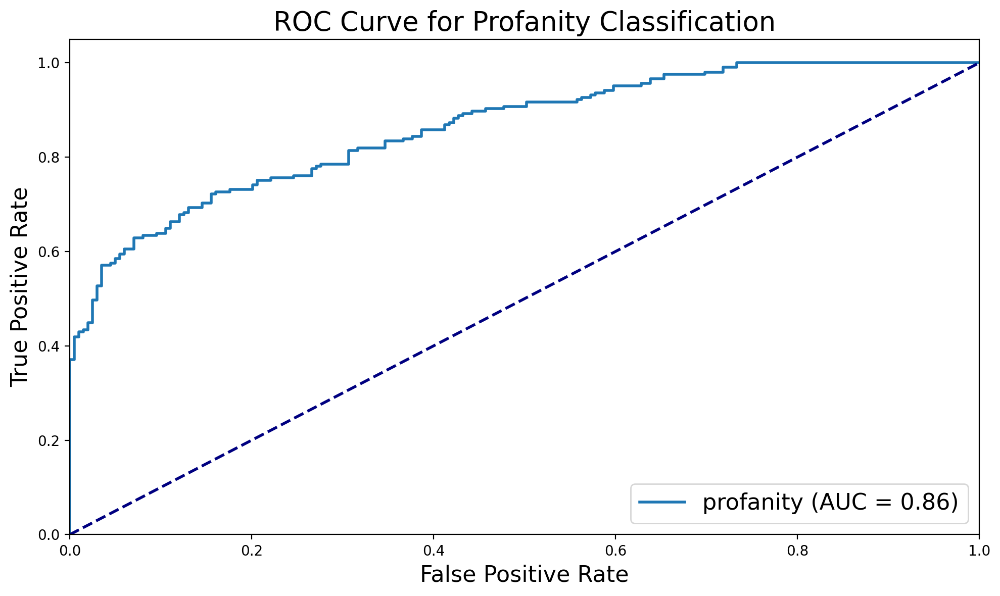

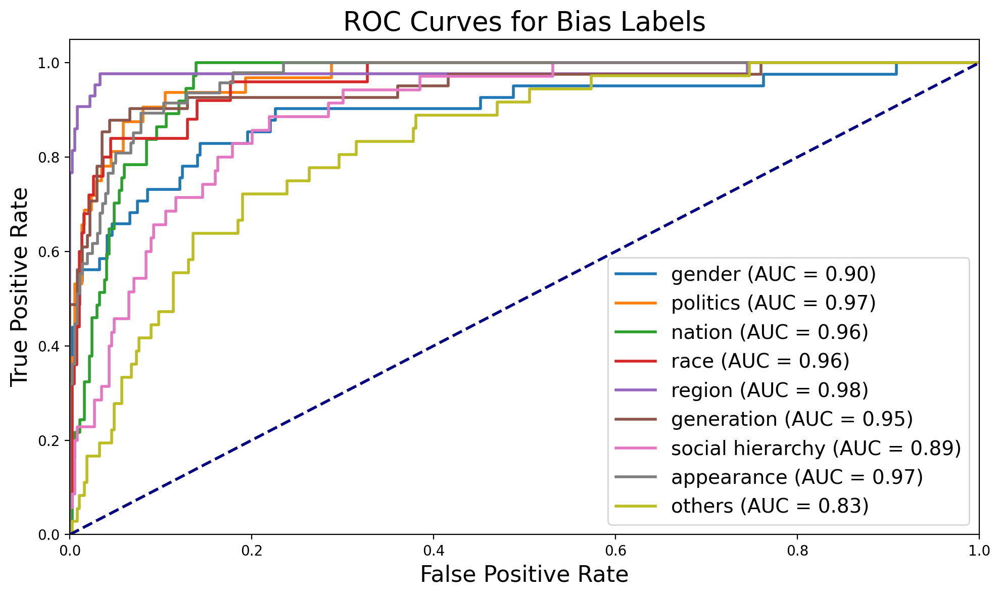

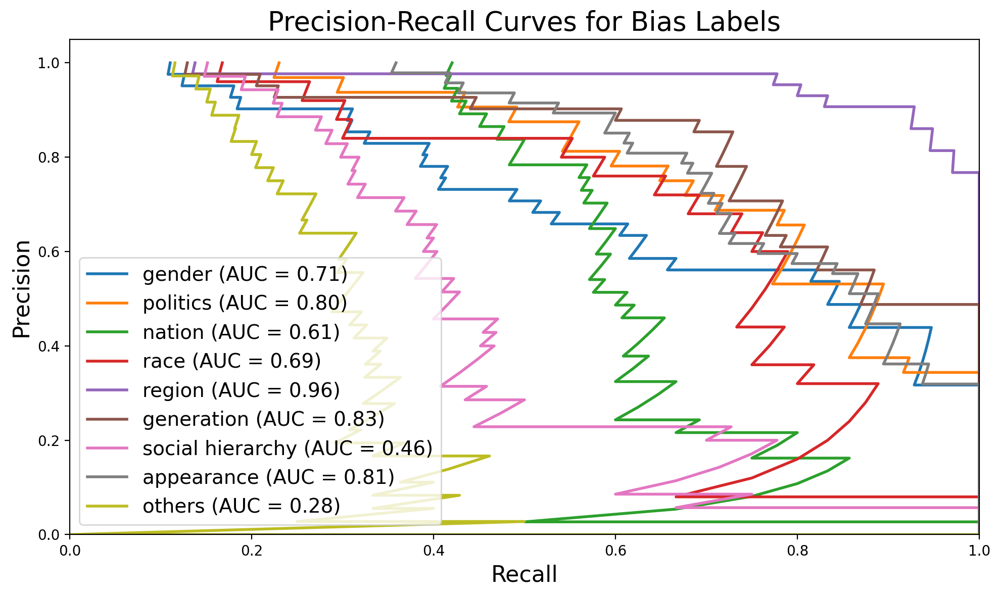


Eval results for Preference.
accuracy : 46.53
f1-macro : 44.29
preference_mae:0.7301980198019802
preference_top2_accuracy:0.7400990128517151
preference_top2_f1:0.4978918396626944

Eval results for Slang.
accuracy : 77.72
precision : 84.85
recall : 68.29
f1 : 75.68
matthews_corrcoef : 56.68
pr_auc : 0.8857402085184833
roc_auc : 0.8621154553254076

Eval results for Gender.
accuracy : 85.4
precision : 39.29
recall : 80.49
f1 : 52.8
matthews_corrcoef : 49.44
pr_auc : 0.7102044643190032
roc_auc : 0.8966606194987569

Eval results for Politic.
accuracy : 89.36
precision : 42.25
recall : 93.75
f1 : 58.25
matthews_corrcoef : 58.7
pr_auc : 0.7952520990861632
roc_auc : 0.9681619623655915

Eval results for Nation.
accuracy : 88.86
precision : 44.59
recall : 89.19
f1 : 59.46
matthews_corrcoef : 58.18
pr_auc : 0.6111031783489805
roc_auc : 0.9558141247514546

Eval results for Race.
accuracy : 87.13
precision : 30.43
recall : 84.0
f1 : 44.68
matthews_corrcoef : 45.67
pr_auc : 0.6909502672503127
roc_a

epoch: 2, train loss: 7.7428: 100%|██████████████████████████████████████| 3836/3836 [25:03<00:00,  2.55it/s]


Preference Accuracy per class
Class 1: 66.98%
Class 2: 45.87%
Class 3: 67.76%
Class 4: 32.03%
Class 5: 29.64%


epoch: 2, valid loss: 8.5885: 100%|████████████████████████████████████████| 101/101 [00:07<00:00, 12.94it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 58.97%
Class 3: 48.51%
Class 4: 59.42%
Class 5: 17.57%


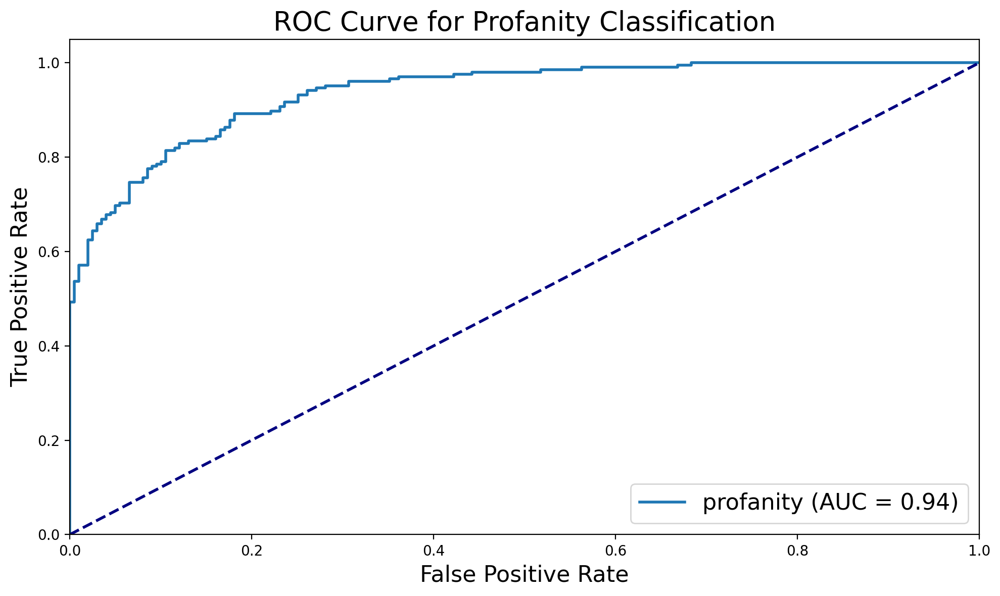

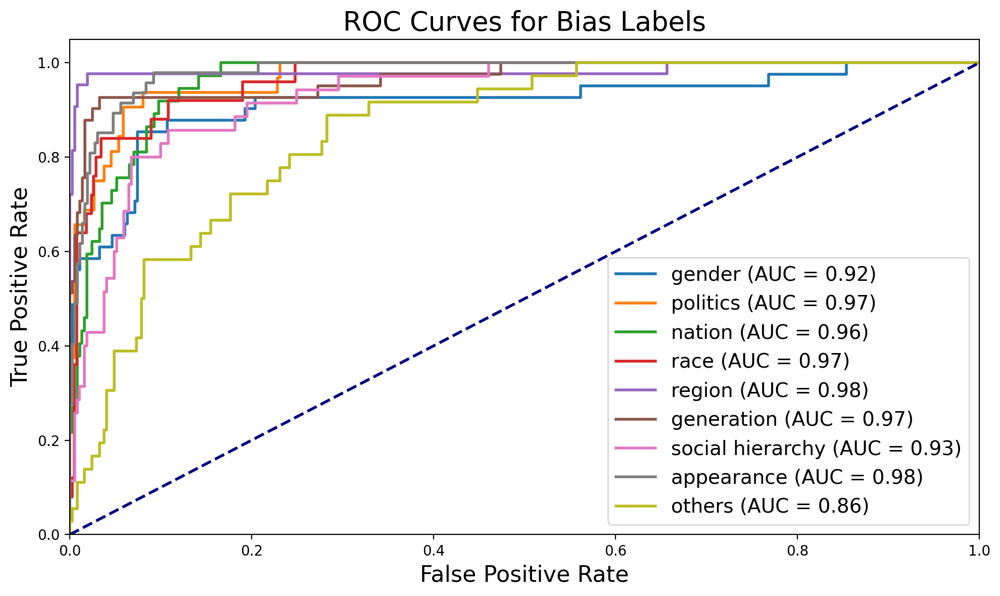

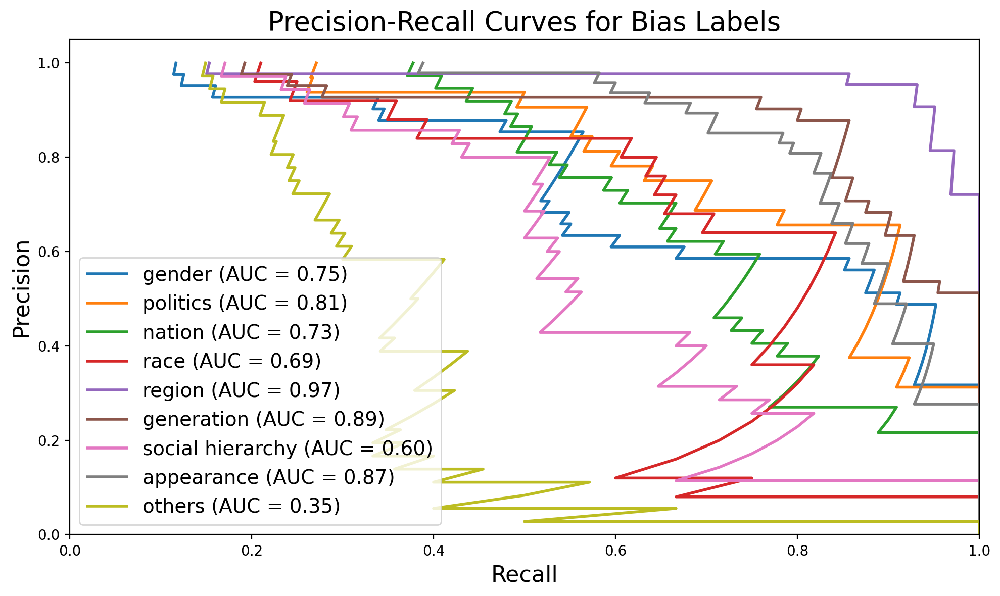


Eval results for Preference.
accuracy : 53.22
f1-macro : 50.82
preference_mae:0.5717821782178217
preference_top2_accuracy:0.8391088843345642
preference_top2_f1:0.573413555422915

Eval results for Slang.
accuracy : 84.16
precision : 89.83
recall : 77.56
f1 : 83.25
matthews_corrcoef : 69.04
pr_auc : 0.9435591308623688
roc_auc : 0.9366834170854271

Eval results for Gender.
accuracy : 89.11
precision : 47.95
recall : 85.37
f1 : 61.4
matthews_corrcoef : 58.78
pr_auc : 0.751465827121585
roc_auc : 0.9155412215279177

Eval results for Politic.
accuracy : 88.12
precision : 39.47
recall : 93.75
f1 : 55.56
matthews_corrcoef : 56.24
pr_auc : 0.8115172636332306
roc_auc : 0.9712701612903225

Eval results for Nation.
accuracy : 89.85
precision : 47.22
recall : 91.89
f1 : 62.39
matthews_corrcoef : 61.45
pr_auc : 0.7323751578077069
roc_auc : 0.9642094410486781

Eval results for Race.
accuracy : 90.1
precision : 37.29
recall : 88.0
f1 : 52.38
matthews_corrcoef : 53.38
pr_auc : 0.6881319127932773
roc_au

epoch: 3, train loss: 6.6486: 100%|██████████████████████████████████████| 3836/3836 [25:29<00:00,  2.51it/s]


Preference Accuracy per class
Class 1: 69.32%
Class 2: 50.53%
Class 3: 69.78%
Class 4: 43.66%
Class 5: 36.73%


epoch: 3, valid loss: 8.0857: 100%|████████████████████████████████████████| 101/101 [00:07<00:00, 13.01it/s]


Preference Accuracy per class
Class 1: 82.93%
Class 2: 61.54%
Class 3: 48.51%
Class 4: 57.97%
Class 5: 36.49%


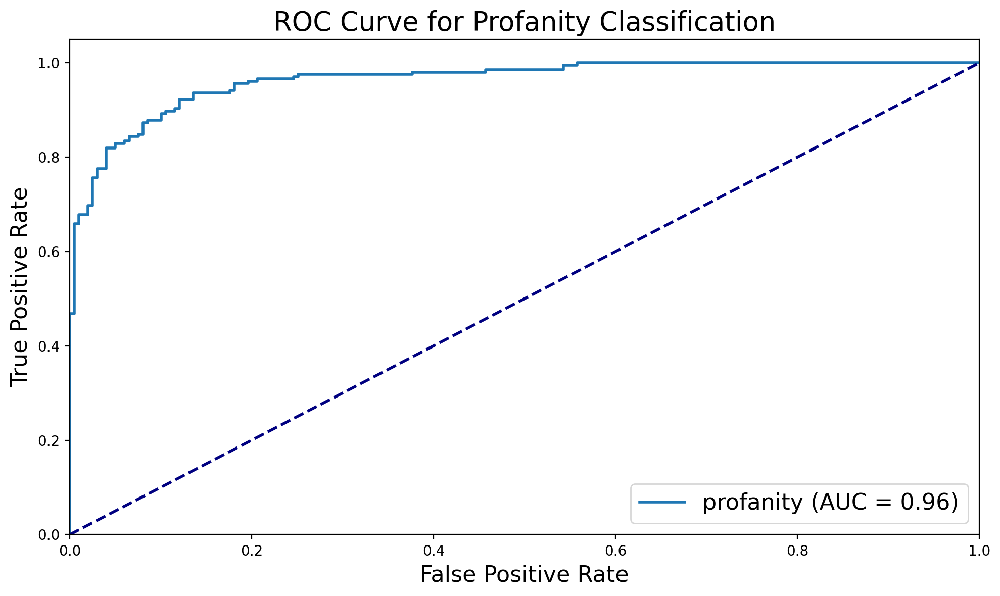

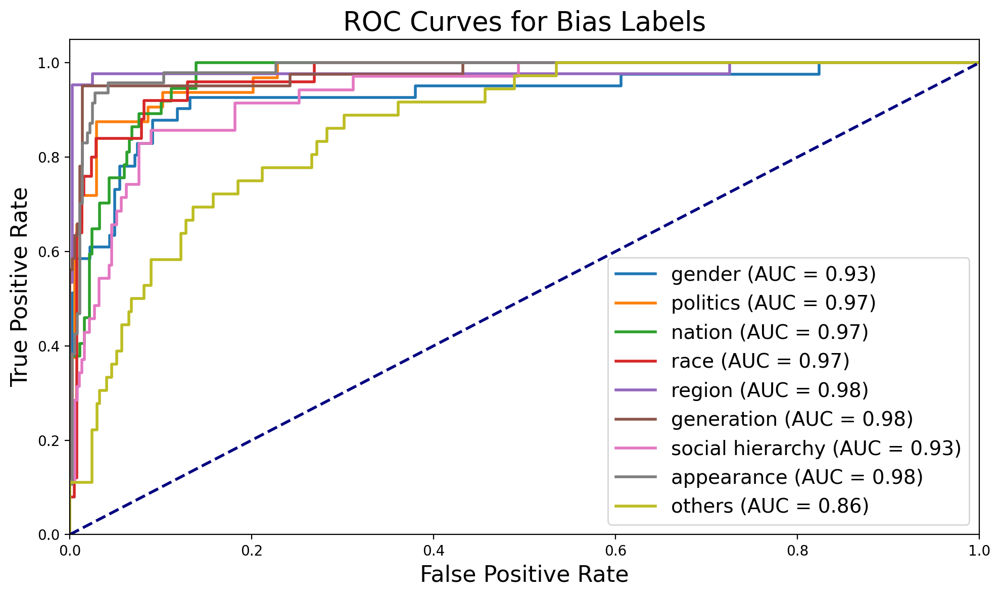

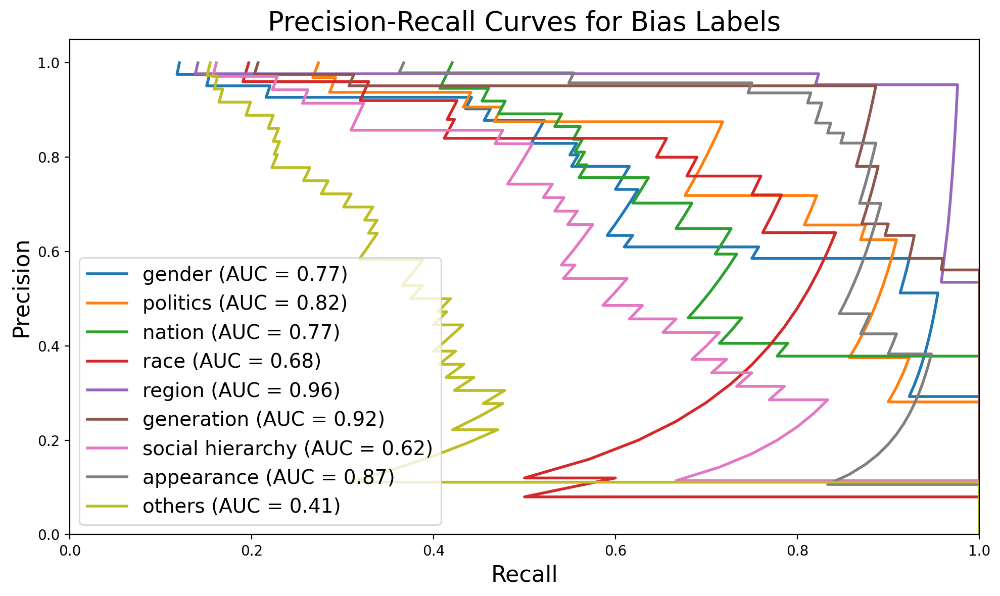


Eval results for Preference.
accuracy : 57.43
f1-macro : 56.75
preference_mae:0.5123762376237624
preference_top2_accuracy:0.8762376308441162
preference_top2_f1:0.5998137077342909

Eval results for Slang.
accuracy : 89.6
precision : 91.37
recall : 87.8
f1 : 89.55
matthews_corrcoef : 79.28
pr_auc : 0.96736928730047
roc_auc : 0.9635984802059075

Eval results for Gender.
accuracy : 91.34
precision : 54.84
recall : 82.93
f1 : 66.02
matthews_corrcoef : 63.01
pr_auc : 0.7749154003359703
roc_auc : 0.9315998118658873

Eval results for Politic.
accuracy : 91.09
precision : 46.67
recall : 87.5
f1 : 60.87
matthews_corrcoef : 59.92
pr_auc : 0.8216430065716476
roc_auc : 0.9733702956989247

Eval results for Nation.
accuracy : 90.59
precision : 49.25
recall : 89.19
f1 : 63.46
matthews_corrcoef : 61.98
pr_auc : 0.7665586571477363
roc_auc : 0.9681861698210471

Eval results for Race.
accuracy : 88.37
precision : 33.82
recall : 92.0
f1 : 49.46
matthews_corrcoef : 51.6
pr_auc : 0.6830492546943248
roc_auc 

epoch: 4, train loss: 5.6396: 100%|██████████████████████████████████████| 3836/3836 [26:45<00:00,  2.39it/s]


Preference Accuracy per class
Class 1: 71.02%
Class 2: 54.12%
Class 3: 69.54%
Class 4: 50.63%
Class 5: 44.73%


epoch: 4, valid loss: 7.9746: 100%|████████████████████████████████████████| 101/101 [00:08<00:00, 12.06it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 60.26%
Class 3: 56.44%
Class 4: 66.67%
Class 5: 63.51%


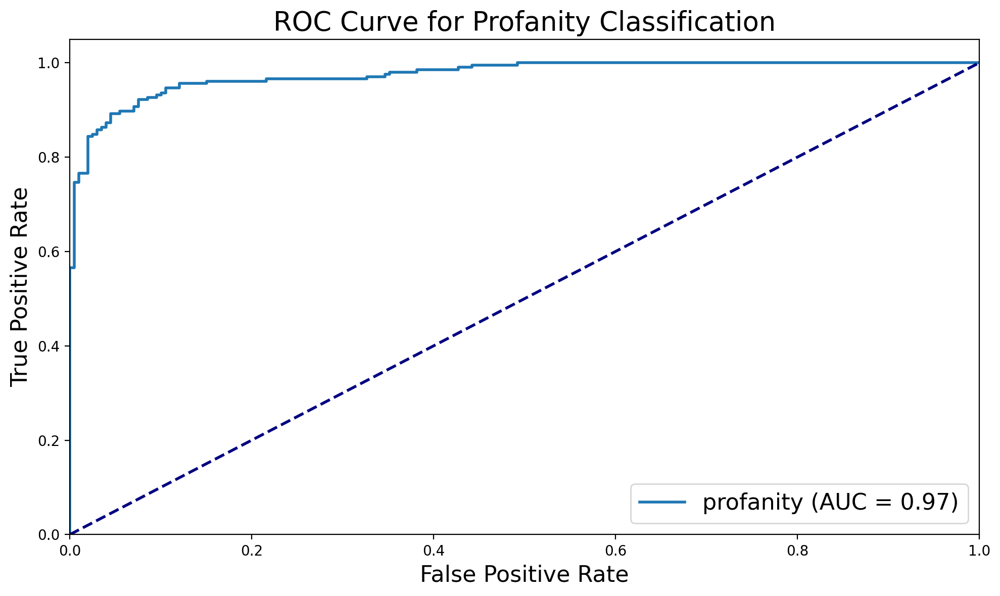

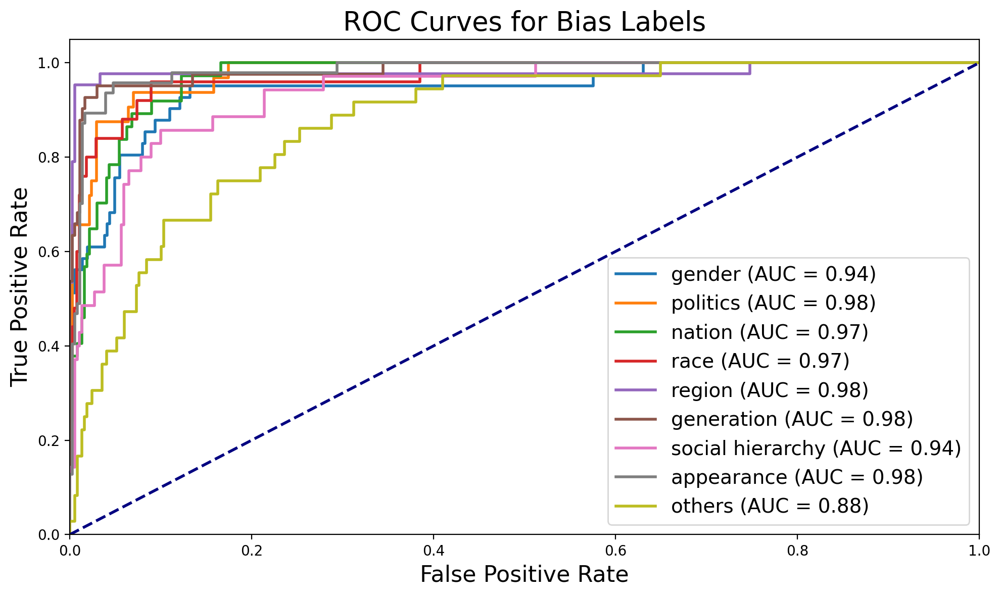

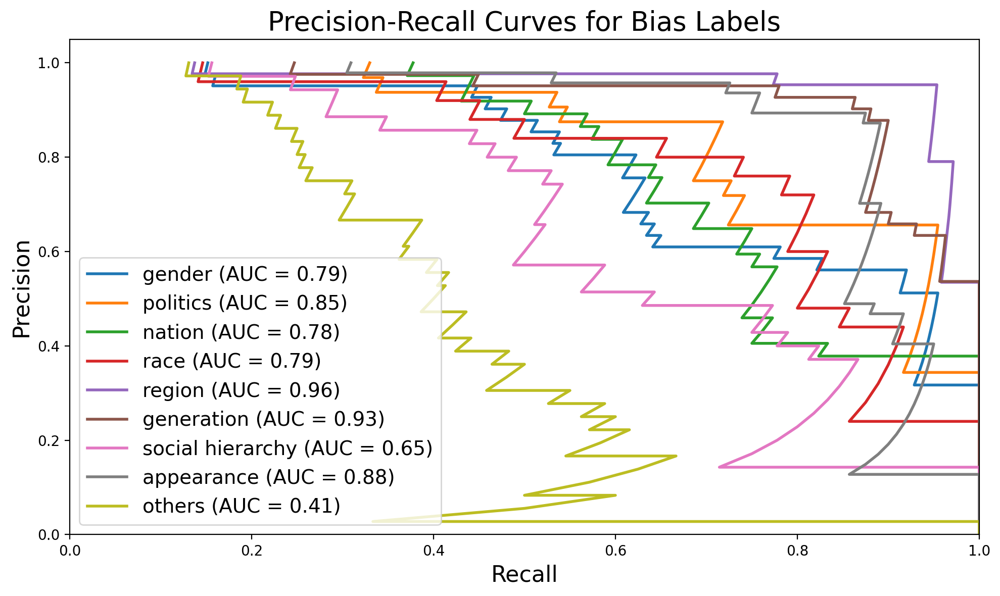


Eval results for Preference.
accuracy : 65.35
f1-macro : 65.58
preference_mae:0.4158415841584158
preference_top2_accuracy:0.9133663177490234
preference_top2_f1:0.6232828336458349

Eval results for Slang.
accuracy : 91.34
precision : 92.93
recall : 89.76
f1 : 91.32
matthews_corrcoef : 82.73
pr_auc : 0.9781254948593022
roc_auc : 0.9745311925481064

Eval results for Gender.
accuracy : 92.08
precision : 57.89
recall : 80.49
f1 : 67.35
matthews_corrcoef : 64.08
pr_auc : 0.7869693235185815
roc_auc : 0.9445004367399046

Eval results for Politic.
accuracy : 93.32
precision : 54.72
recall : 90.62
f1 : 68.24
matthews_corrcoef : 67.33
pr_auc : 0.8479319349886159
roc_auc : 0.9787466397849462

Eval results for Nation.
accuracy : 91.09
precision : 50.77
recall : 89.19
f1 : 64.71
matthews_corrcoef : 63.17
pr_auc : 0.7848060098933061
roc_auc : 0.970542749834303

Eval results for Race.
accuracy : 91.09
precision : 40.35
recall : 92.0
f1 : 56.1
matthews_corrcoef : 57.47
pr_auc : 0.793727747741515
roc_a

epoch: 5, train loss: 5.1348: 100%|██████████████████████████████████████| 3836/3836 [28:03<00:00,  2.28it/s]


Preference Accuracy per class
Class 1: 71.40%
Class 2: 55.78%
Class 3: 70.27%
Class 4: 53.63%
Class 5: 51.09%


epoch: 5, valid loss: 9.1586: 100%|████████████████████████████████████████| 101/101 [00:08<00:00, 11.71it/s]


Preference Accuracy per class
Class 1: 82.93%
Class 2: 61.54%
Class 3: 64.36%
Class 4: 72.46%
Class 5: 52.70%


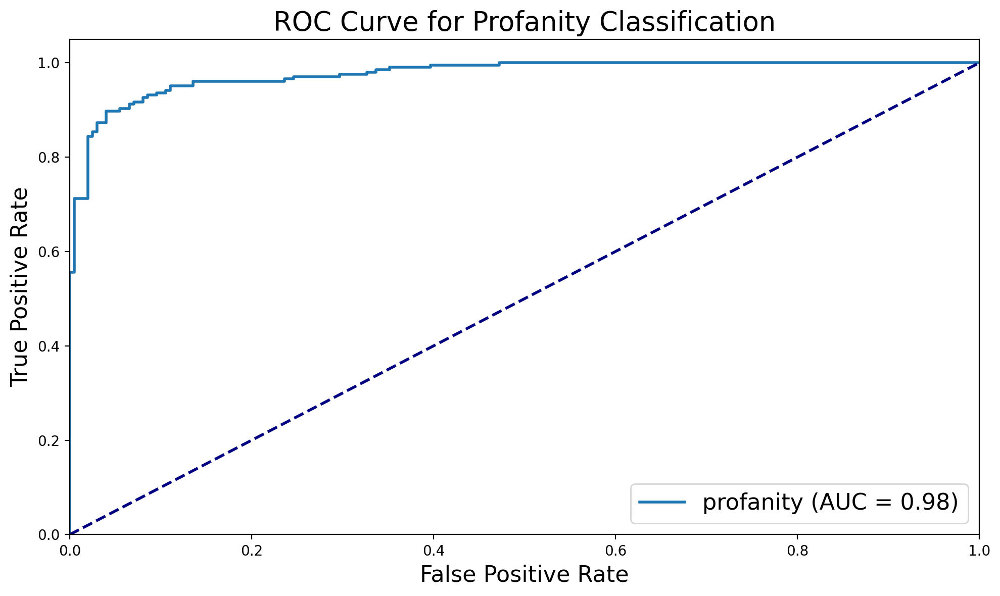

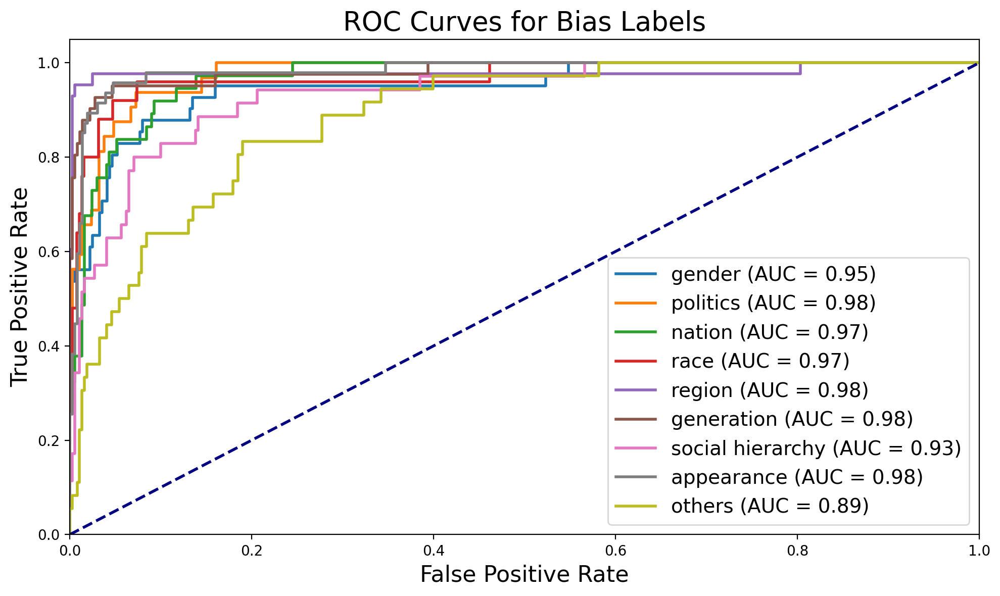

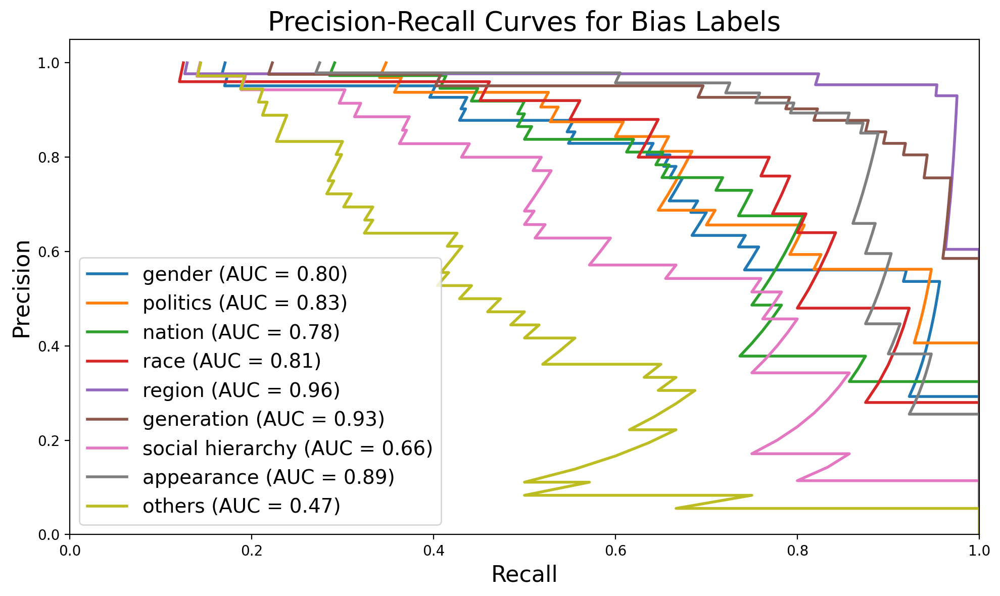


Eval results for Preference.
accuracy : 66.83
f1-macro : 66.54
preference_mae:0.3935643564356436
preference_top2_accuracy:0.9257425665855408
preference_top2_f1:0.631833531055399

Eval results for Slang.
accuracy : 92.08
precision : 92.61
recall : 91.71
f1 : 92.16
matthews_corrcoef : 84.16
pr_auc : 0.9785422550218006
roc_auc : 0.9759284226008089

Eval results for Gender.
accuracy : 93.56
precision : 64.71
recall : 80.49
f1 : 71.74
matthews_corrcoef : 68.67
pr_auc : 0.7964928904169749
roc_auc : 0.9491365988040046

Eval results for Politic.
accuracy : 93.07
precision : 53.85
recall : 87.5
f1 : 66.67
matthews_corrcoef : 65.36
pr_auc : 0.8282729925687625
roc_auc : 0.9769825268817205

Eval results for Nation.
accuracy : 90.59
precision : 49.23
recall : 86.49
f1 : 62.75
matthews_corrcoef : 60.83
pr_auc : 0.7838077871333866
roc_auc : 0.9685543854481184

Eval results for Race.
accuracy : 93.56
precision : 48.94
recall : 92.0
f1 : 63.89
matthews_corrcoef : 64.38
pr_auc : 0.8138090017992037
roc_

epoch: 6, train loss: 4.8172: 100%|██████████████████████████████████████| 3836/3836 [28:04<00:00,  2.28it/s]


Preference Accuracy per class
Class 1: 72.69%
Class 2: 56.53%
Class 3: 70.42%
Class 4: 56.62%
Class 5: 52.55%


epoch: 6, valid loss: 10.6874: 100%|███████████████████████████████████████| 101/101 [00:08<00:00, 11.76it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 66.67%
Class 3: 64.36%
Class 4: 69.57%
Class 5: 64.86%


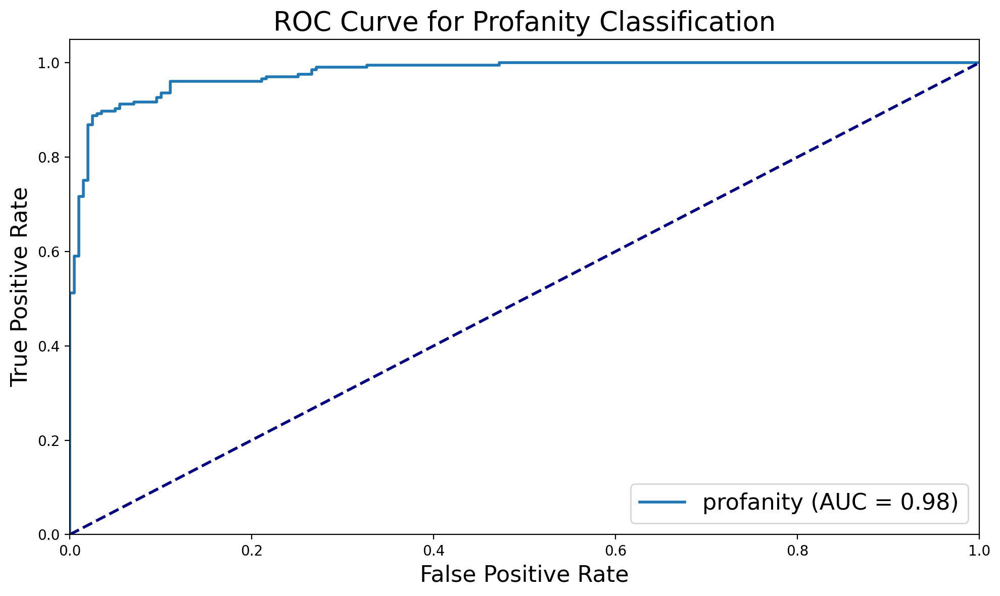

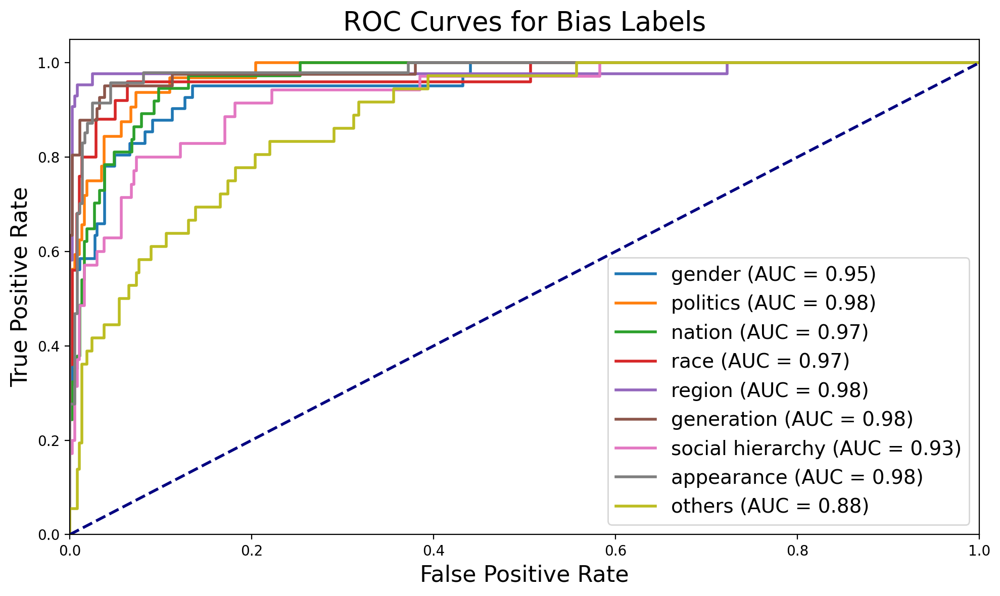

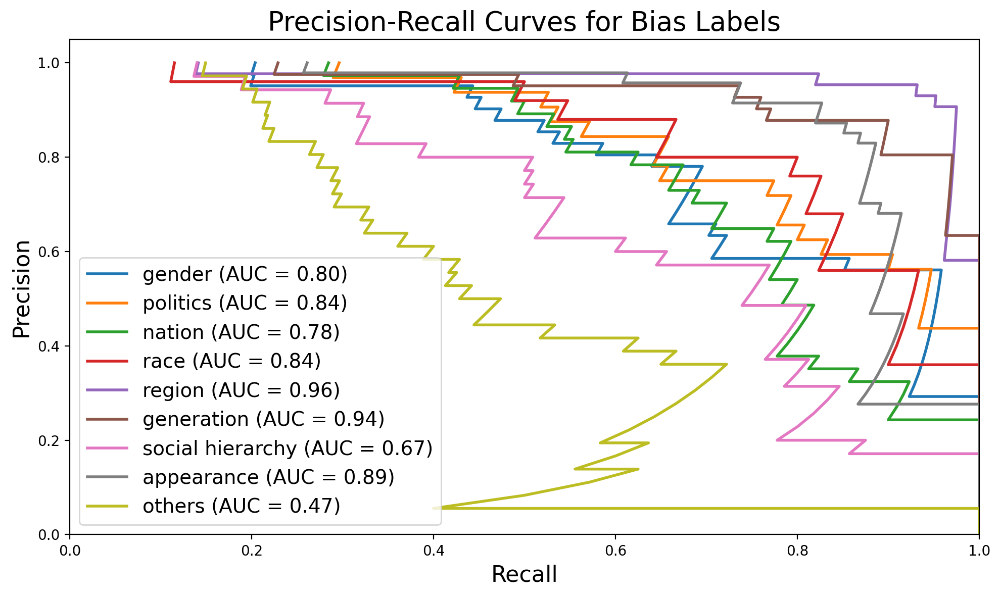


Eval results for Preference.
accuracy : 69.06
f1-macro : 69.25
preference_mae:0.35396039603960394
preference_top2_accuracy:0.9282178282737732
preference_top2_f1:0.633775810393564

Eval results for Slang.
accuracy : 92.57
precision : 94.42
recall : 90.73
f1 : 92.54
matthews_corrcoef : 85.22
pr_auc : 0.979244385512609
roc_auc : 0.9777913960044122

Eval results for Gender.
accuracy : 92.33
precision : 58.62
recall : 82.93
f1 : 68.69
matthews_corrcoef : 65.72
pr_auc : 0.8001727059707816
roc_auc : 0.954713431431835

Eval results for Politic.
accuracy : 94.06
precision : 58.7
recall : 84.38
f1 : 69.23
matthews_corrcoef : 67.39
pr_auc : 0.8417287629383656
roc_auc : 0.9777385752688172

Eval results for Nation.
accuracy : 92.08
precision : 54.39
recall : 83.78
f1 : 65.96
matthews_corrcoef : 63.55
pr_auc : 0.7757110928000269
roc_auc : 0.9684807423227041

Eval results for Race.
accuracy : 94.55
precision : 53.49
recall : 92.0
f1 : 67.65
matthews_corrcoef : 67.75
pr_auc : 0.8400081083788165
roc_a

epoch: 7, train loss: 4.3573: 100%|██████████████████████████████████████| 3836/3836 [28:06<00:00,  2.27it/s]


Preference Accuracy per class
Class 1: 72.43%
Class 2: 58.21%
Class 3: 71.93%
Class 4: 58.53%
Class 5: 57.09%


epoch: 7, valid loss: 9.9663: 100%|████████████████████████████████████████| 101/101 [00:08<00:00, 11.47it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 67.95%
Class 3: 62.38%
Class 4: 68.12%
Class 5: 62.16%


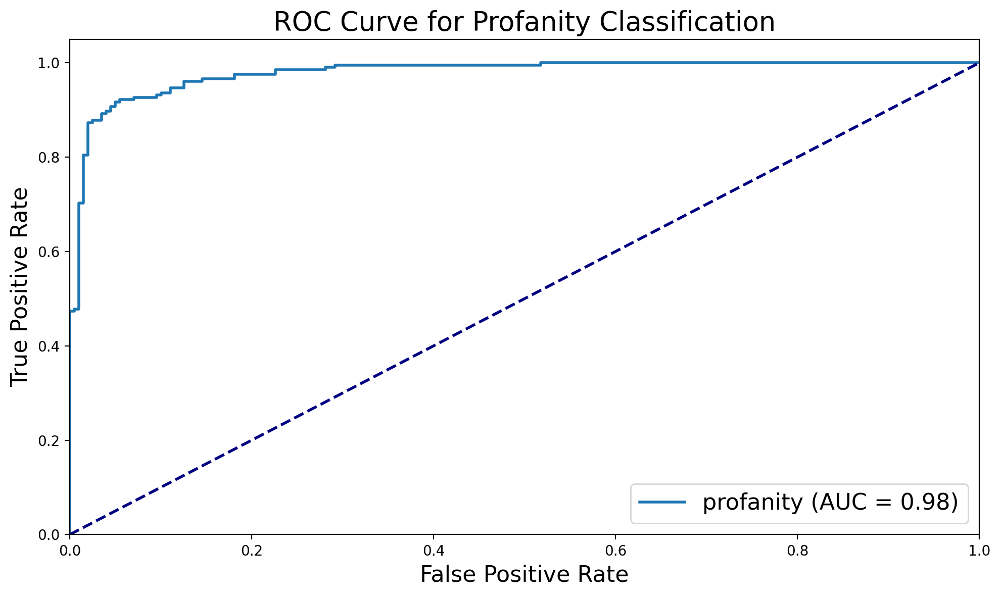

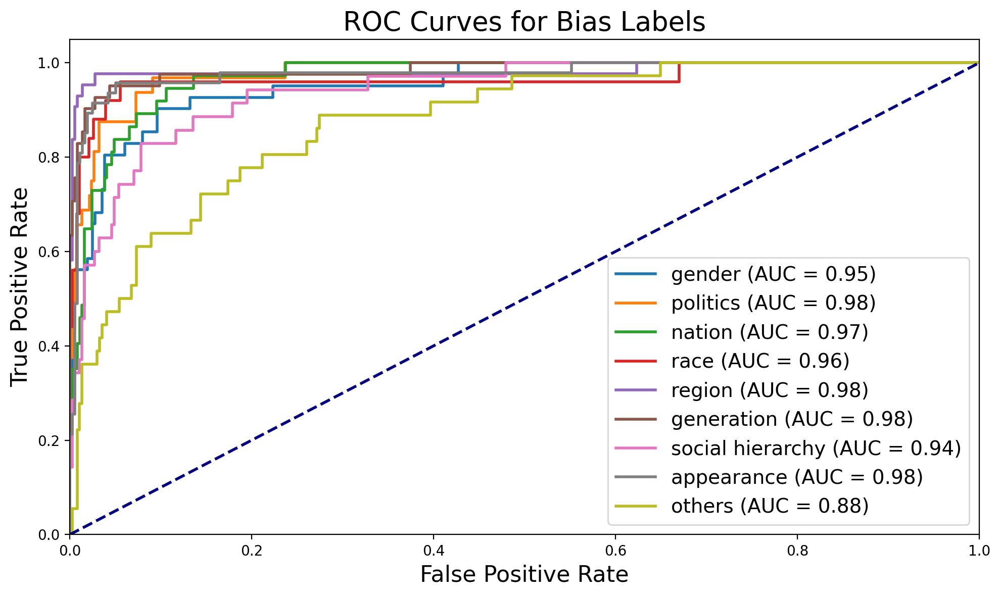

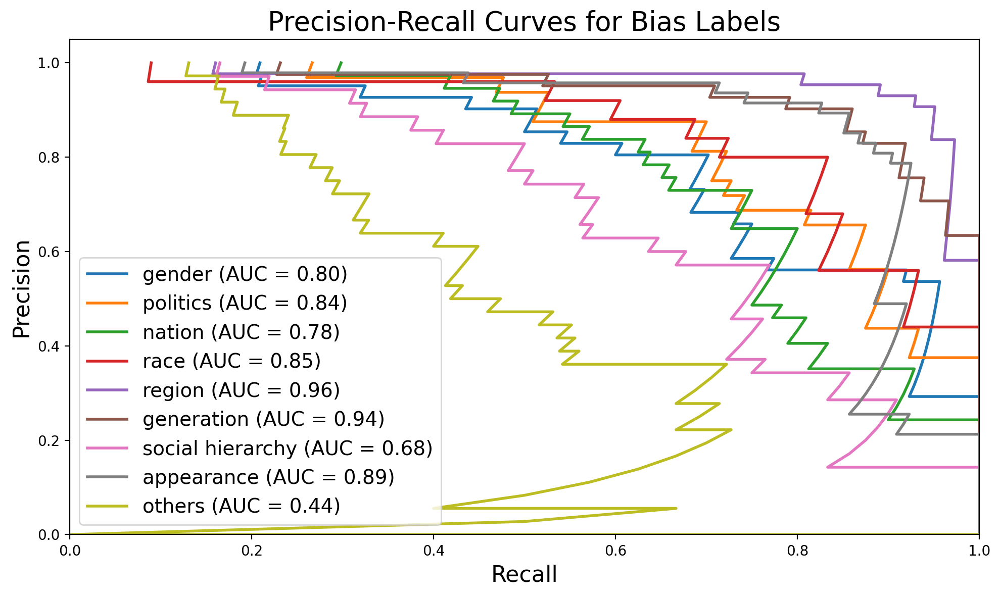


Eval results for Preference.
accuracy : 68.32
f1-macro : 68.58
preference_mae:0.3613861386138614
preference_top2_accuracy:0.9207921028137207
preference_top2_f1:0.6330268051579924

Eval results for Slang.
accuracy : 92.57
precision : 93.1
recall : 92.2
f1 : 92.65
matthews_corrcoef : 85.15
pr_auc : 0.9790817816750292
roc_auc : 0.9785512930506189

Eval results for Gender.
accuracy : 93.32
precision : 63.46
recall : 80.49
f1 : 70.97
matthews_corrcoef : 67.86
pr_auc : 0.8015493931489923
roc_auc : 0.9544446684136263

Eval results for Politic.
accuracy : 94.55
precision : 60.87
recall : 87.5
f1 : 71.79
matthews_corrcoef : 70.28
pr_auc : 0.8395675310670625
roc_auc : 0.9780745967741936

Eval results for Nation.
accuracy : 92.57
precision : 56.14
recall : 86.49
f1 : 68.09
matthews_corrcoef : 66.02
pr_auc : 0.7818403764733193
roc_auc : 0.969659032329332

Eval results for Race.
accuracy : 94.31
precision : 52.27
recall : 92.0
f1 : 66.67
matthews_corrcoef : 66.87
pr_auc : 0.8548859205807159
roc_au

epoch: 8, train loss: 4.3941: 100%|██████████████████████████████████████| 3836/3836 [28:16<00:00,  2.26it/s]


Preference Accuracy per class
Class 1: 73.63%
Class 2: 59.81%
Class 3: 71.89%
Class 4: 59.56%
Class 5: 59.09%


epoch: 8, valid loss: 11.8006: 100%|███████████████████████████████████████| 101/101 [00:08<00:00, 11.58it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 65.38%
Class 3: 61.39%
Class 4: 73.91%
Class 5: 63.51%


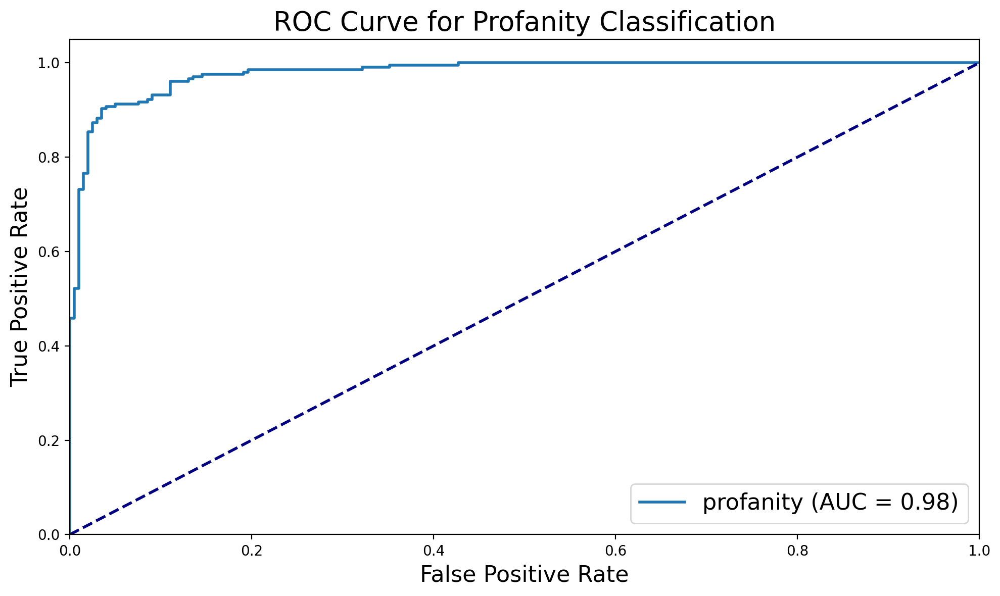

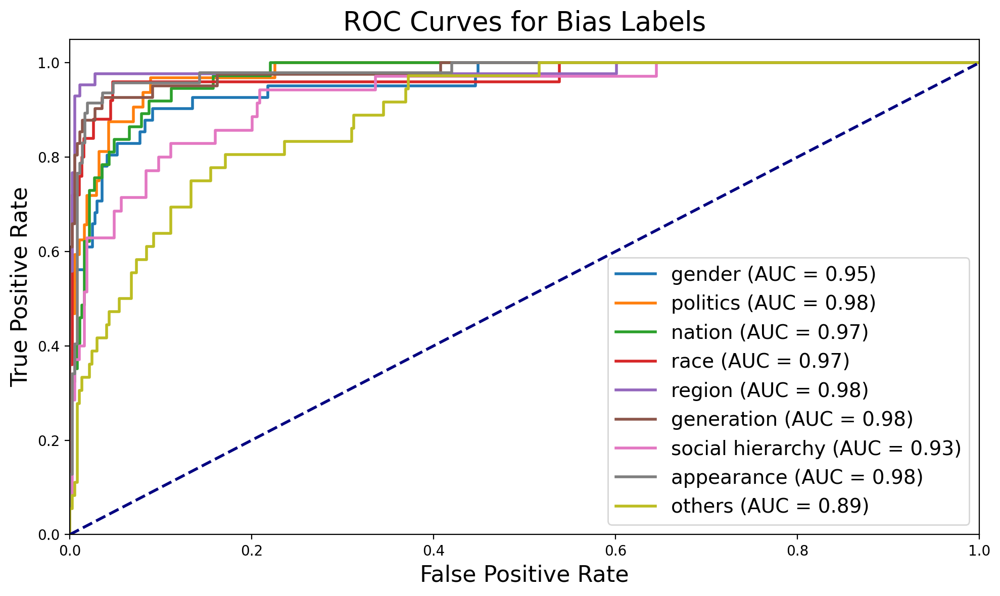

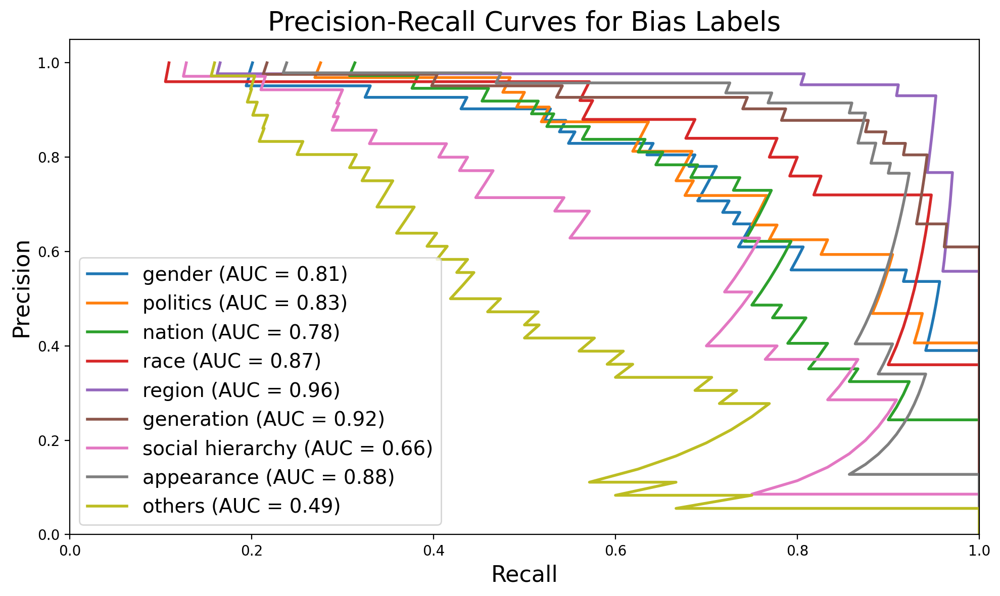


Eval results for Preference.
accuracy : 69.8
f1-macro : 69.95
preference_mae:0.33910891089108913
preference_top2_accuracy:0.9232673048973083
preference_top2_f1:0.6303173872874795

Eval results for Slang.
accuracy : 92.08
precision : 93.03
recall : 91.22
f1 : 92.12
matthews_corrcoef : 84.18
pr_auc : 0.9796063586176019
roc_auc : 0.979213138865057

Eval results for Gender.
accuracy : 93.32
precision : 62.96
recall : 82.93
f1 : 71.58
matthews_corrcoef : 68.7
pr_auc : 0.8135729635465557
roc_auc : 0.9545790499227307

Eval results for Politic.
accuracy : 93.56
precision : 56.0
recall : 87.5
f1 : 68.29
matthews_corrcoef : 66.91
pr_auc : 0.8319748335196215
roc_auc : 0.9769825268817205

Eval results for Nation.
accuracy : 92.33
precision : 55.17
recall : 86.49
f1 : 67.37
matthews_corrcoef : 65.32
pr_auc : 0.7829127164100058
roc_auc : 0.9699536048309889

Eval results for Race.
accuracy : 93.56
precision : 48.98
recall : 96.0
f1 : 64.86
matthews_corrcoef : 65.98
pr_auc : 0.8669778464934565
roc_au

epoch: 9, train loss: 4.0649: 100%|██████████████████████████████████████| 3836/3836 [28:06<00:00,  2.27it/s]


Preference Accuracy per class
Class 1: 73.60%
Class 2: 60.74%
Class 3: 71.73%
Class 4: 64.00%
Class 5: 58.00%


epoch: 9, valid loss: 12.6668: 100%|███████████████████████████████████████| 101/101 [00:08<00:00, 11.94it/s]


Preference Accuracy per class
Class 1: 85.37%
Class 2: 65.38%
Class 3: 61.39%
Class 4: 71.01%
Class 5: 64.86%


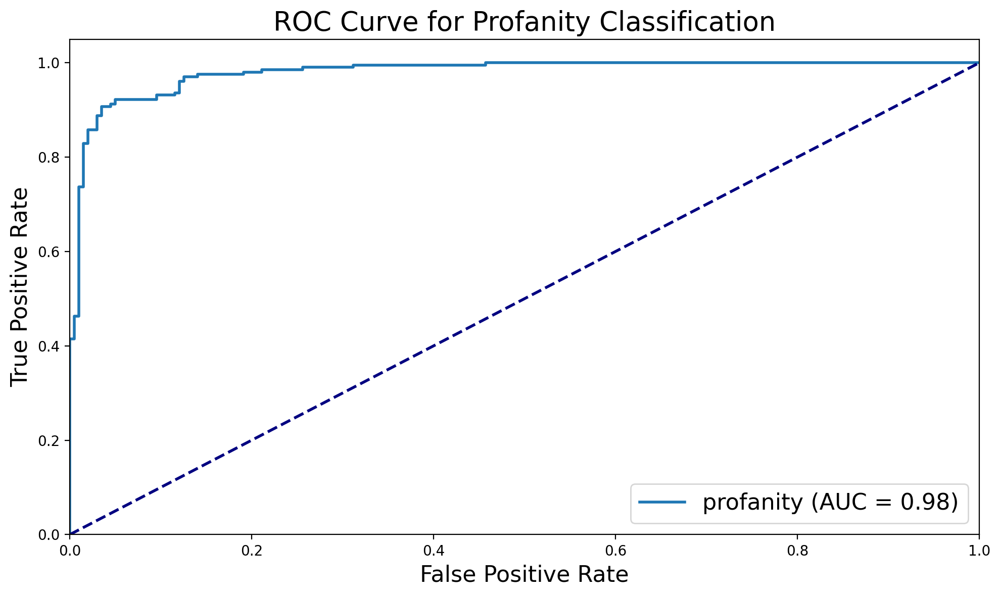

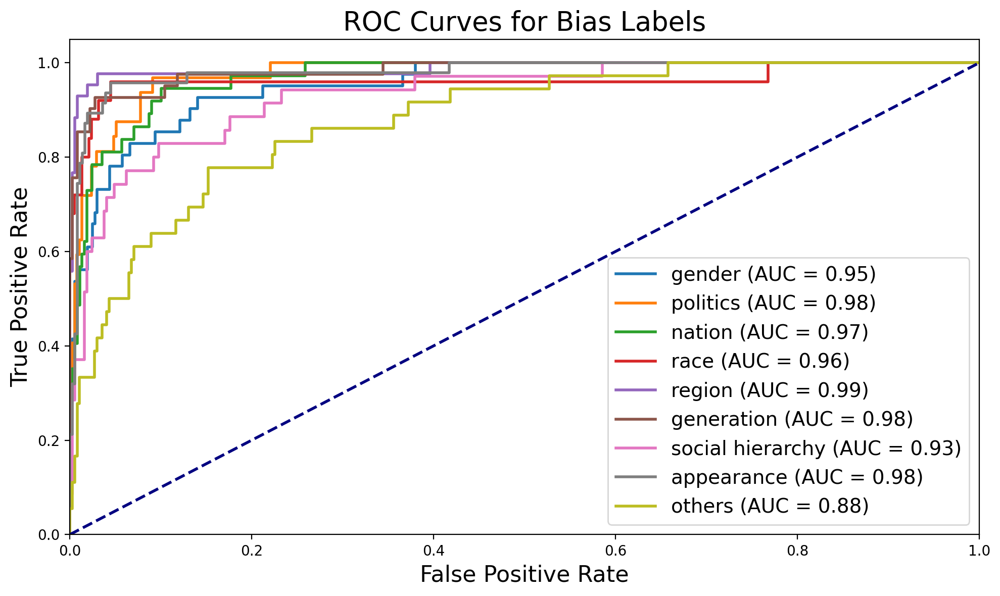

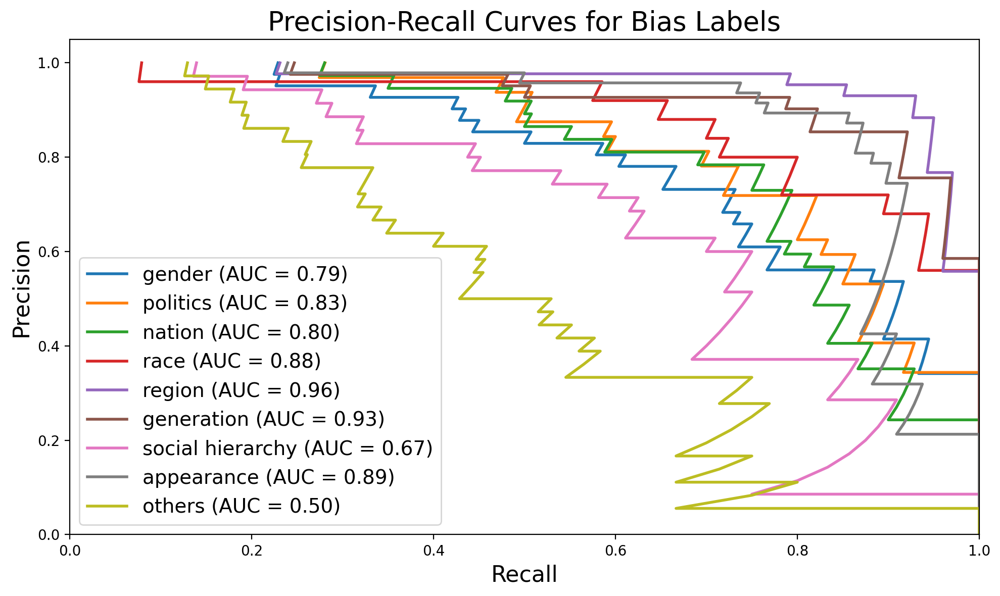


Eval results for Preference.
accuracy : 69.31
f1-macro : 69.55
preference_mae:0.3415841584158416
preference_top2_accuracy:0.9257425665855408
preference_top2_f1:0.6330705996895238

Eval results for Slang.
accuracy : 92.57
precision : 93.1
recall : 92.2
f1 : 92.65
matthews_corrcoef : 85.15
pr_auc : 0.9792468341880726
roc_auc : 0.9794337541365363

Eval results for Gender.
accuracy : 92.08
precision : 57.89
recall : 80.49
f1 : 67.35
matthews_corrcoef : 64.08
pr_auc : 0.7939811044396504
roc_auc : 0.9541759053954175

Eval results for Politic.
accuracy : 94.06
precision : 58.33
recall : 87.5
f1 : 70.0
matthews_corrcoef : 68.54
pr_auc : 0.8262316416921095
roc_auc : 0.9768985215053764

Eval results for Nation.
accuracy : 92.08
precision : 54.39
recall : 83.78
f1 : 65.96
matthews_corrcoef : 63.55
pr_auc : 0.800840609664304
roc_auc : 0.969953604830989

Eval results for Race.
accuracy : 94.06
precision : 51.06
recall : 96.0
f1 : 66.67
matthews_corrcoef : 67.58
pr_auc : 0.8812756517858394
roc_auc 

epoch: 10, train loss: 3.5931: 100%|█████████████████████████████████████| 3836/3836 [28:02<00:00,  2.28it/s]


Preference Accuracy per class
Class 1: 74.71%
Class 2: 60.96%
Class 3: 72.86%
Class 4: 66.36%
Class 5: 61.45%


epoch: 10, valid loss: 14.0425: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 12.24it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 66.67%
Class 3: 64.36%
Class 4: 72.46%
Class 5: 59.46%


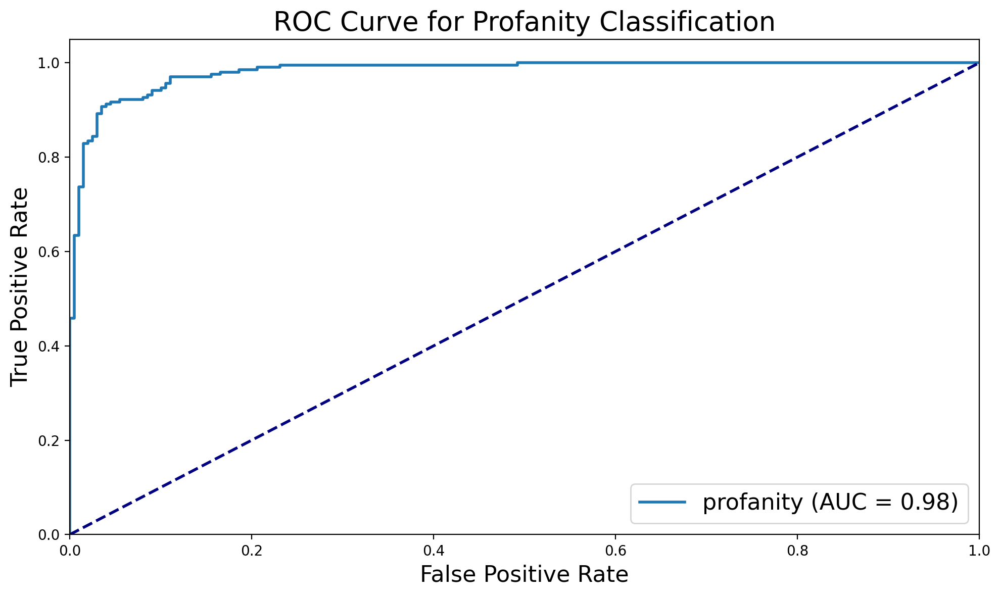

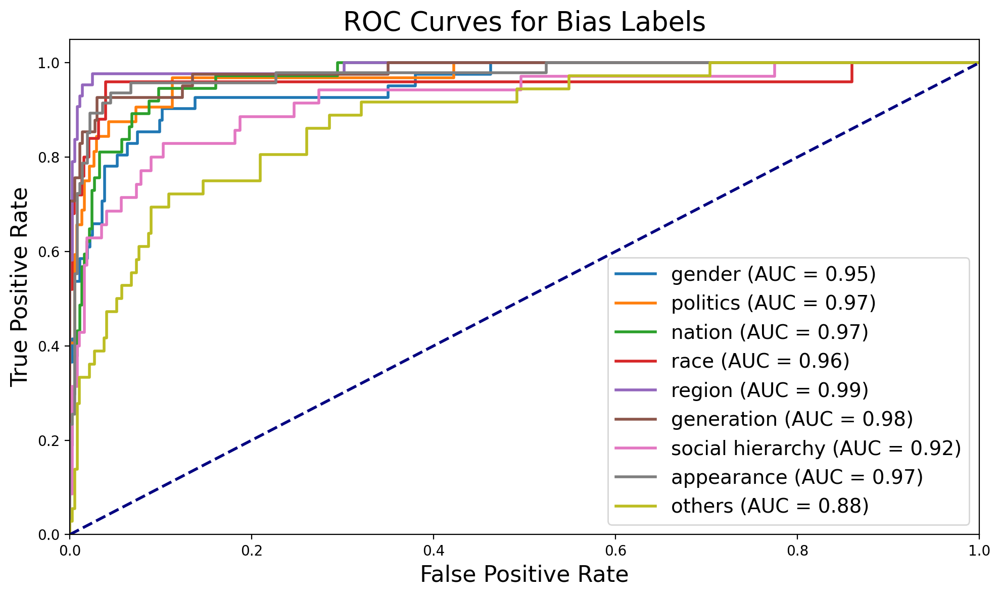

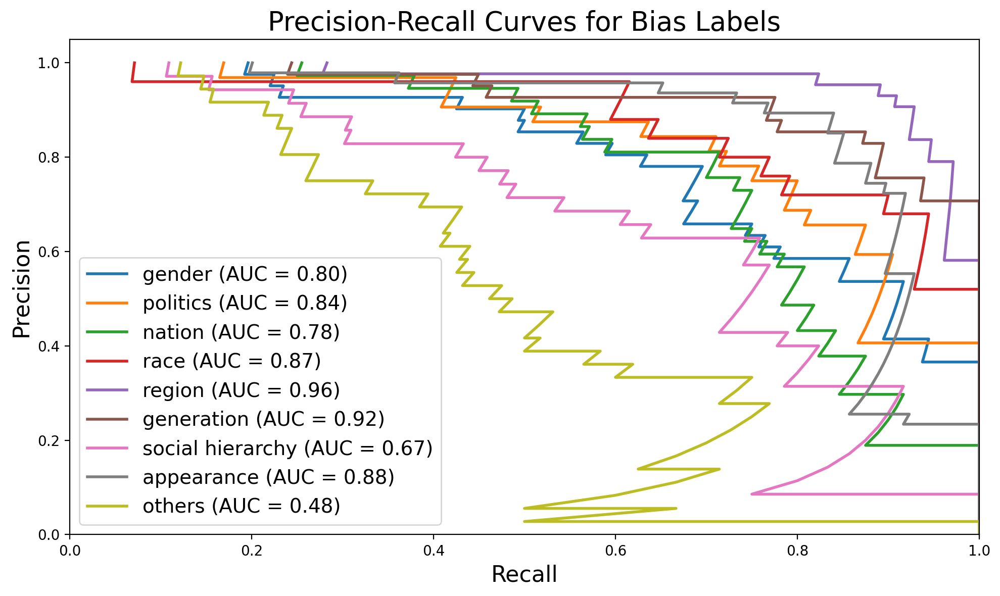


Eval results for Preference.
accuracy : 68.56
f1-macro : 68.87
preference_mae:0.3465346534653465
preference_top2_accuracy:0.9306930899620056
preference_top2_f1:0.637903213856867

Eval results for Slang.
accuracy : 93.32
precision : 94.95
recall : 91.71
f1 : 93.3
matthews_corrcoef : 86.69
pr_auc : 0.9821919716486294
roc_auc : 0.981836009314867

Eval results for Gender.
accuracy : 93.56
precision : 65.31
recall : 78.05
f1 : 71.11
matthews_corrcoef : 67.86
pr_auc : 0.7970929543358077
roc_auc : 0.950480413895048

Eval results for Politic.
accuracy : 95.3
precision : 65.85
recall : 84.38
f1 : 73.97
matthews_corrcoef : 72.09
pr_auc : 0.8371056211676934
roc_auc : 0.970766129032258

Eval results for Nation.
accuracy : 93.56
precision : 61.22
recall : 81.08
f1 : 69.77
matthews_corrcoef : 67.06
pr_auc : 0.7799614227515477
roc_auc : 0.9686280285735327

Eval results for Race.
accuracy : 94.8
precision : 54.55
recall : 96.0
f1 : 69.57
matthews_corrcoef : 70.17
pr_auc : 0.8735485317058463
roc_auc :

epoch: 11, train loss: 3.4315: 100%|█████████████████████████████████████| 3836/3836 [28:06<00:00,  2.27it/s]


Preference Accuracy per class
Class 1: 74.42%
Class 2: 61.82%
Class 3: 73.18%
Class 4: 66.53%
Class 5: 63.27%


epoch: 11, valid loss: 14.2675: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 11.62it/s]


Preference Accuracy per class
Class 1: 89.02%
Class 2: 57.69%
Class 3: 66.34%
Class 4: 76.81%
Class 5: 62.16%


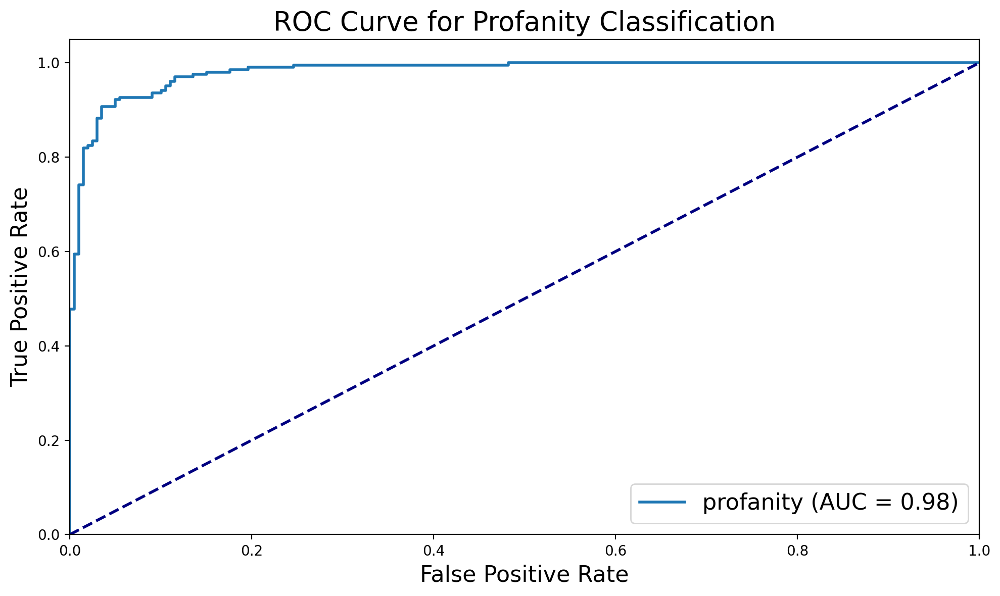

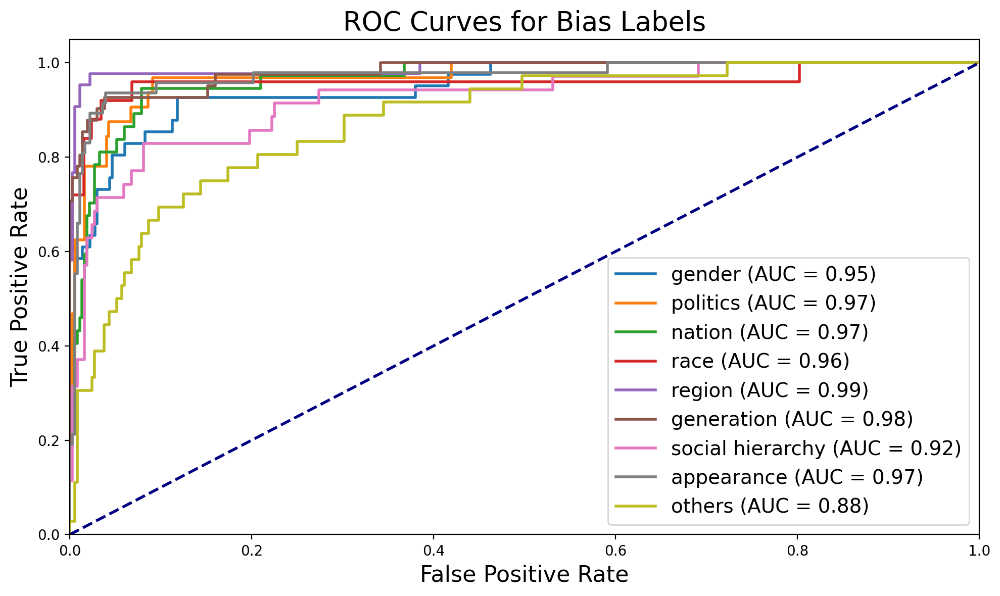

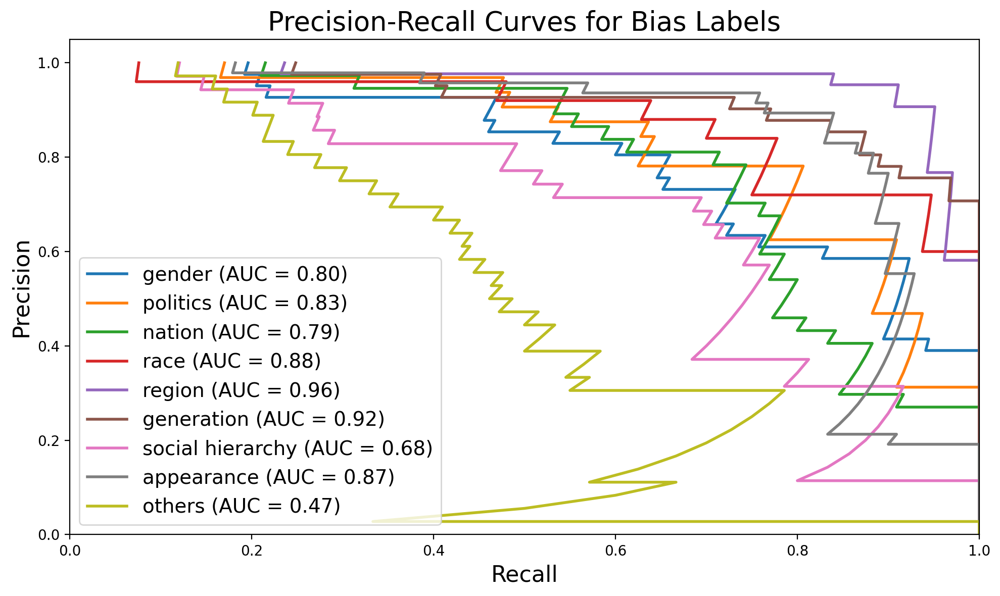


Eval results for Preference.
accuracy : 70.3
f1-macro : 70.17
preference_mae:0.3316831683168317
preference_top2_accuracy:0.9306930899620056
preference_top2_f1:0.6339528644986894

Eval results for Slang.
accuracy : 93.56
precision : 94.53
recall : 92.68
f1 : 93.6
matthews_corrcoef : 87.15
pr_auc : 0.98200099434023
roc_auc : 0.9817134452751562

Eval results for Gender.
accuracy : 92.57
precision : 60.0
recall : 80.49
f1 : 68.75
matthews_corrcoef : 65.54
pr_auc : 0.8025818219847639
roc_auc : 0.9491365988040046

Eval results for Politic.
accuracy : 94.8
precision : 62.79
recall : 84.38
f1 : 72.0
matthews_corrcoef : 70.12
pr_auc : 0.8314637742236842
roc_auc : 0.9716061827956988

Eval results for Nation.
accuracy : 93.07
precision : 58.49
recall : 83.78
f1 : 68.89
matthews_corrcoef : 66.46
pr_auc : 0.7914739154030879
roc_auc : 0.9667869504381766

Eval results for Race.
accuracy : 95.3
precision : 57.5
recall : 92.0
f1 : 70.77
matthews_corrcoef : 70.6
pr_auc : 0.8803606726585423
roc_auc : 0.

epoch: 12, train loss: 2.982: 100%|██████████████████████████████████████| 3836/3836 [27:56<00:00,  2.29it/s]


Preference Accuracy per class
Class 1: 73.92%
Class 2: 63.81%
Class 3: 73.05%
Class 4: 69.53%
Class 5: 65.27%


epoch: 12, valid loss: 14.3414: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 11.83it/s]


Preference Accuracy per class
Class 1: 90.24%
Class 2: 64.10%
Class 3: 67.33%
Class 4: 75.36%
Class 5: 62.16%


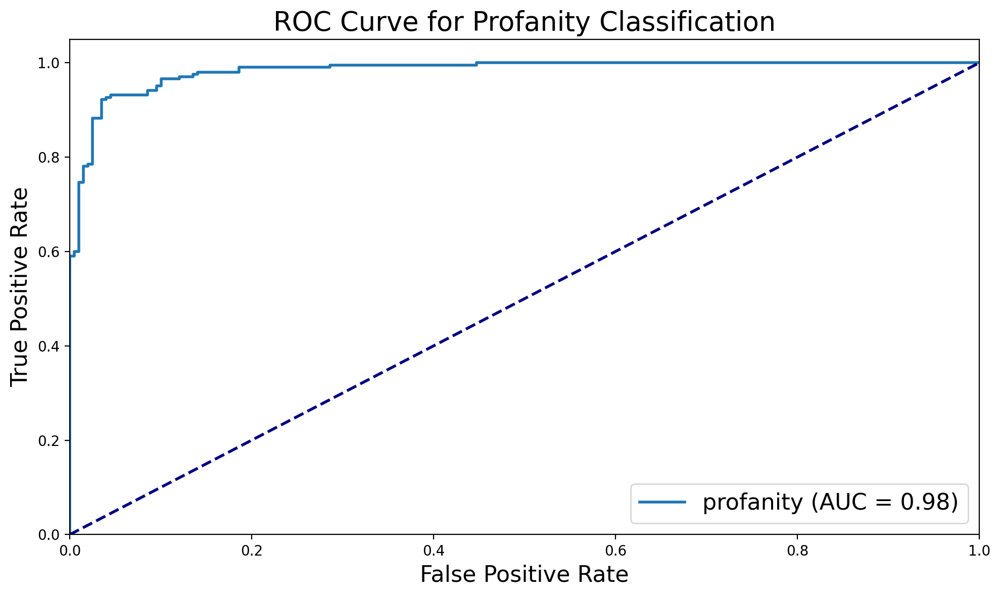

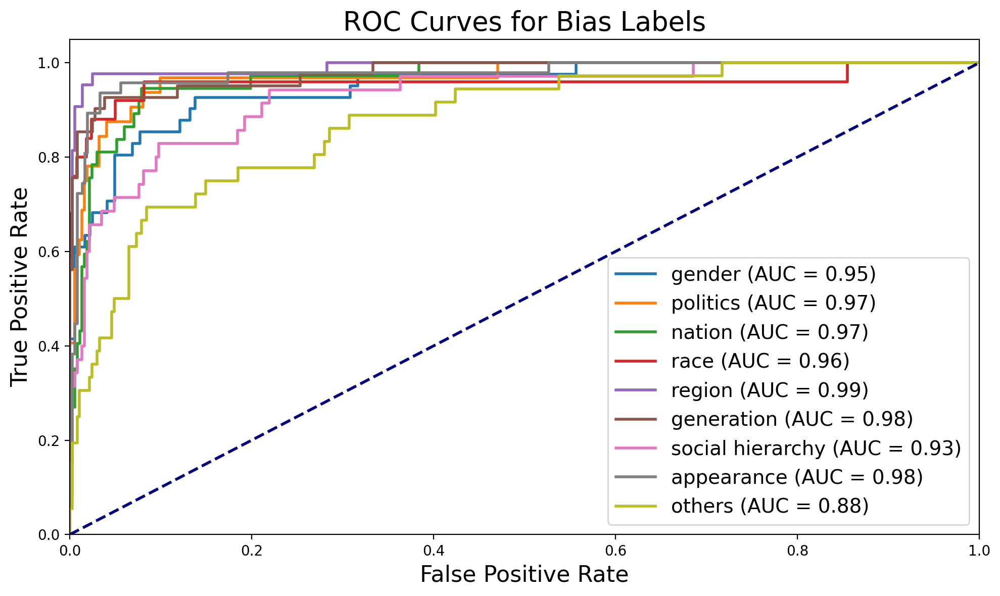

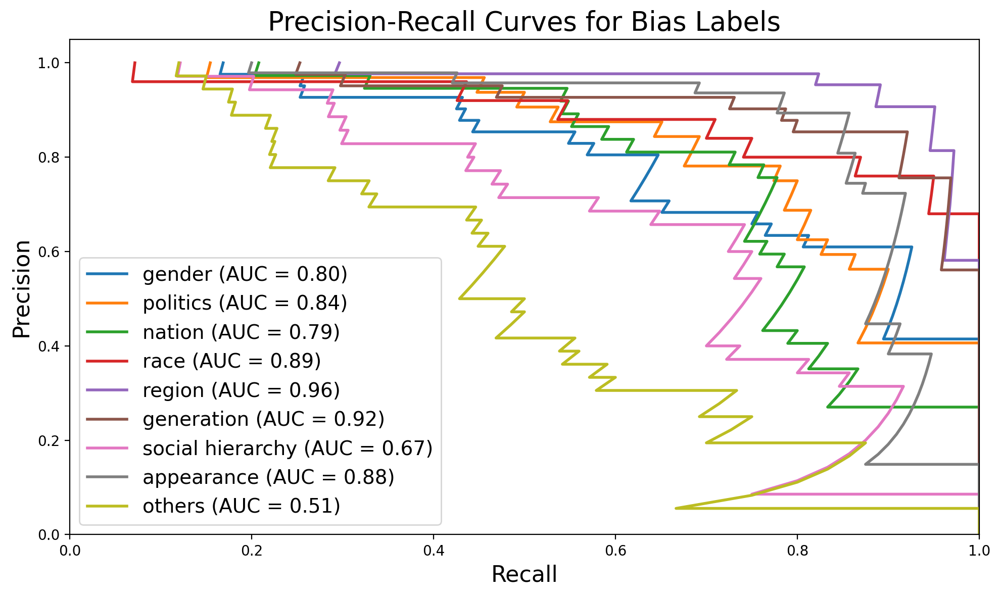


Eval results for Preference.
accuracy : 71.78
f1-macro : 71.66
preference_mae:0.31435643564356436
preference_top2_accuracy:0.9356435537338257
preference_top2_f1:0.6400264690784923

Eval results for Slang.
accuracy : 92.82
precision : 92.72
recall : 93.17
f1 : 92.94
matthews_corrcoef : 85.64
pr_auc : 0.9836676678752921
roc_auc : 0.9830616497119745

Eval results for Gender.
accuracy : 93.07
precision : 62.26
recall : 80.49
f1 : 70.21
matthews_corrcoef : 67.06
pr_auc : 0.8029945119151468
roc_auc : 0.9496069340858698

Eval results for Politic.
accuracy : 95.05
precision : 63.64
recall : 87.5
f1 : 73.68
matthews_corrcoef : 72.13
pr_auc : 0.8356624178135581
roc_auc : 0.9704301075268817

Eval results for Nation.
accuracy : 94.06
precision : 63.83
recall : 81.08
f1 : 71.43
matthews_corrcoef : 68.77
pr_auc : 0.7876678179507052
roc_auc : 0.9667133073127623

Eval results for Race.
accuracy : 94.55
precision : 53.66
recall : 88.0
f1 : 66.67
matthews_corrcoef : 66.21
pr_auc : 0.8901978751699792
ro

epoch: 13, train loss: 3.0405: 100%|█████████████████████████████████████| 3836/3836 [27:41<00:00,  2.31it/s]


Preference Accuracy per class
Class 1: 75.92%
Class 2: 63.63%
Class 3: 74.05%
Class 4: 71.72%
Class 5: 67.82%


epoch: 13, valid loss: 14.5254: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 11.95it/s]


Preference Accuracy per class
Class 1: 85.37%
Class 2: 69.23%
Class 3: 59.41%
Class 4: 71.01%
Class 5: 74.32%


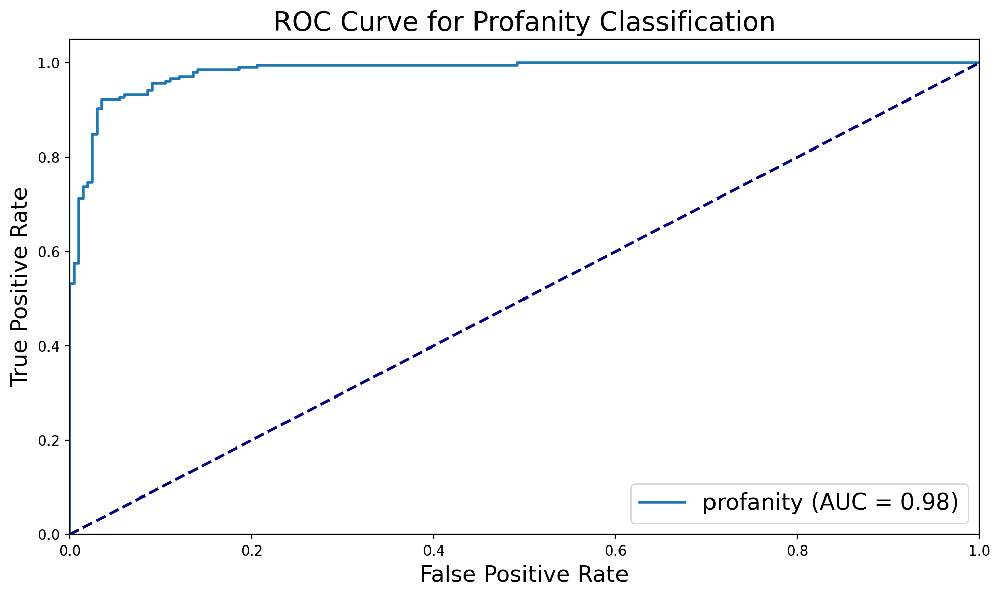

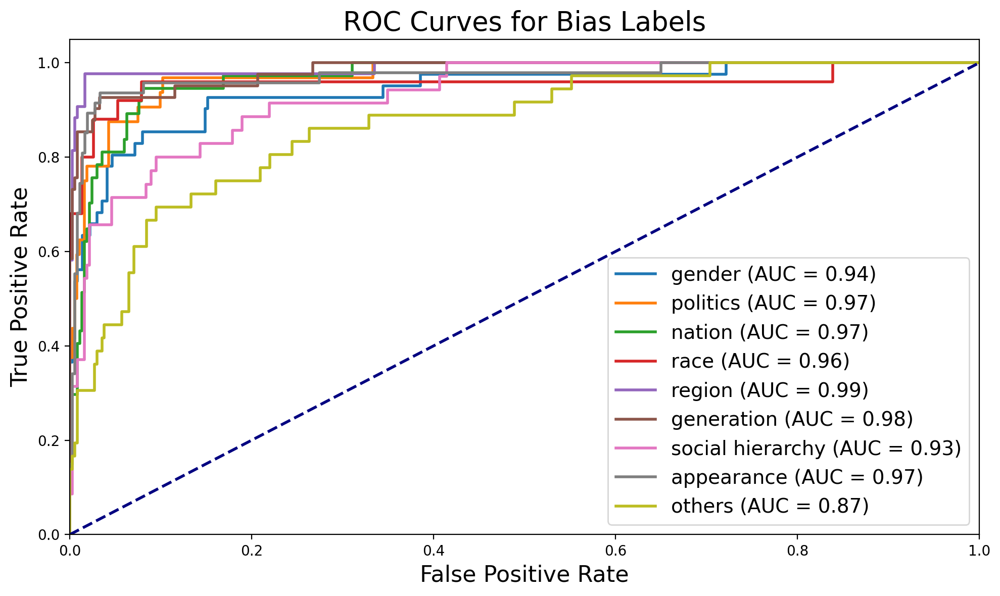

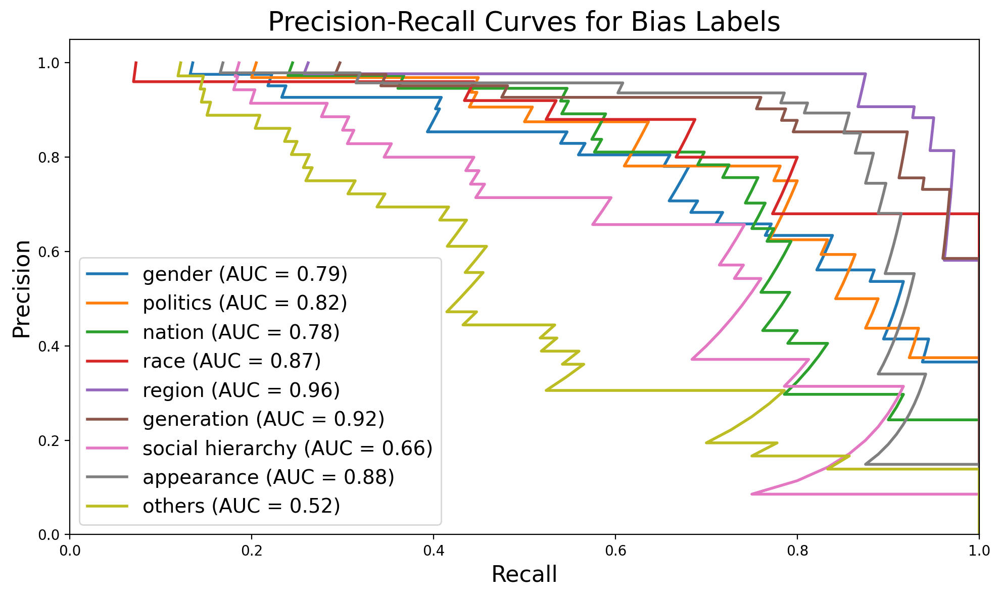


Eval results for Preference.
accuracy : 71.29
f1-macro : 71.82
preference_mae:0.3217821782178218
preference_top2_accuracy:0.9282178282737732
preference_top2_f1:0.6333954465709447

Eval results for Slang.
accuracy : 93.32
precision : 93.63
recall : 93.17
f1 : 93.4
matthews_corrcoef : 86.63
pr_auc : 0.9823697609515532
roc_auc : 0.9822772398578258

Eval results for Gender.
accuracy : 93.32
precision : 63.46
recall : 80.49
f1 : 70.97
matthews_corrcoef : 67.86
pr_auc : 0.7932955164265124
roc_auc : 0.9416112342941612

Eval results for Politic.
accuracy : 95.05
precision : 63.64
recall : 87.5
f1 : 73.68
matthews_corrcoef : 72.13
pr_auc : 0.8248593263074306
roc_auc : 0.972698252688172

Eval results for Nation.
accuracy : 94.06
precision : 63.83
recall : 81.08
f1 : 71.43
matthews_corrcoef : 68.77
pr_auc : 0.7821298629165754
roc_auc : 0.9688489579497754

Eval results for Race.
accuracy : 95.3
precision : 57.89
recall : 88.0
f1 : 69.84
matthews_corrcoef : 69.15
pr_auc : 0.8702089012603355
roc_au

epoch: 14, train loss: 2.6071: 100%|█████████████████████████████████████| 3836/3836 [27:23<00:00,  2.33it/s]


Preference Accuracy per class
Class 1: 76.24%
Class 2: 64.29%
Class 3: 74.04%
Class 4: 72.87%
Class 5: 68.55%


epoch: 14, valid loss: 16.1581: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 12.23it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 65.38%
Class 3: 65.35%
Class 4: 76.81%
Class 5: 66.22%


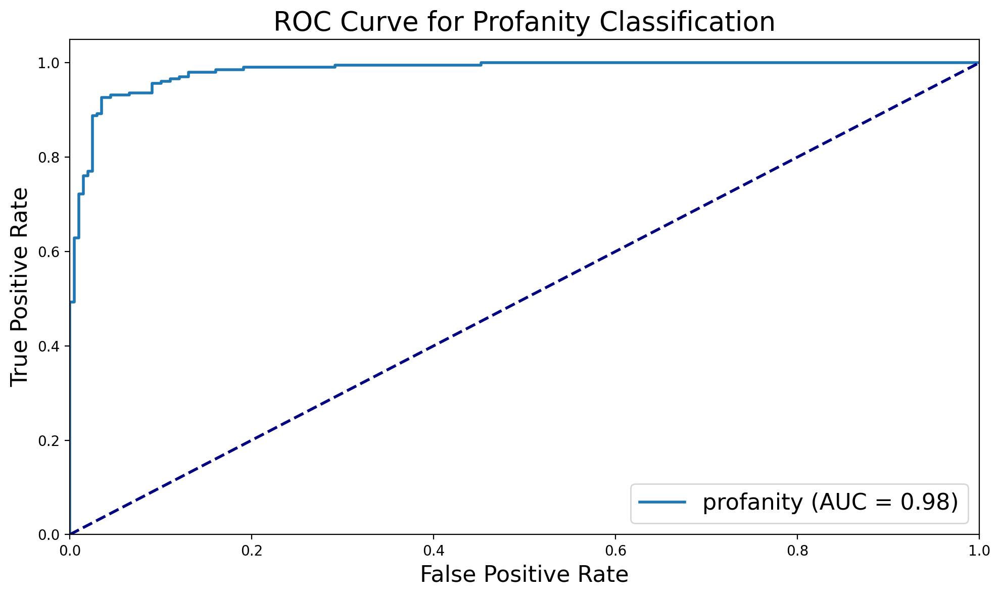

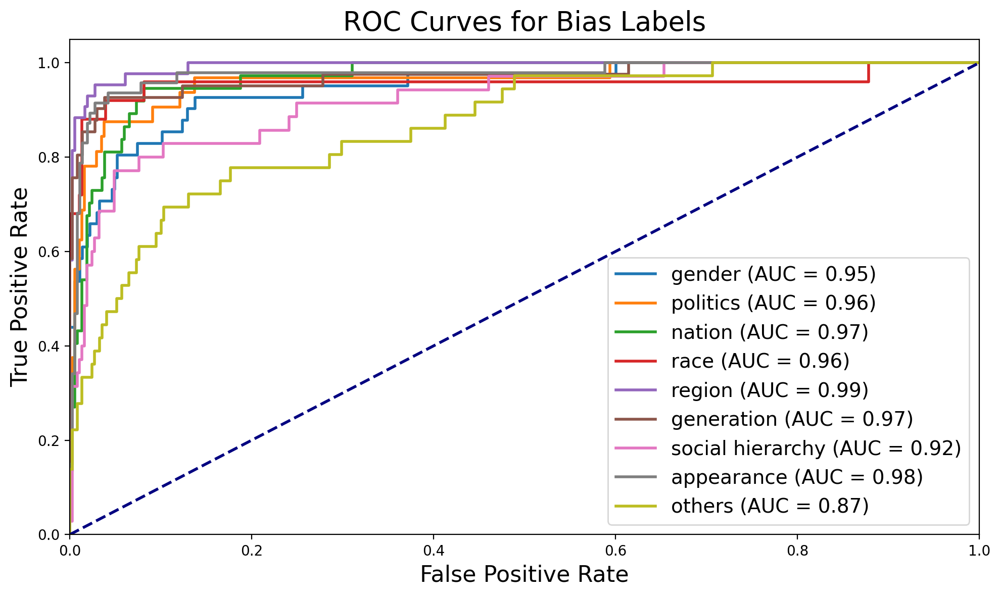

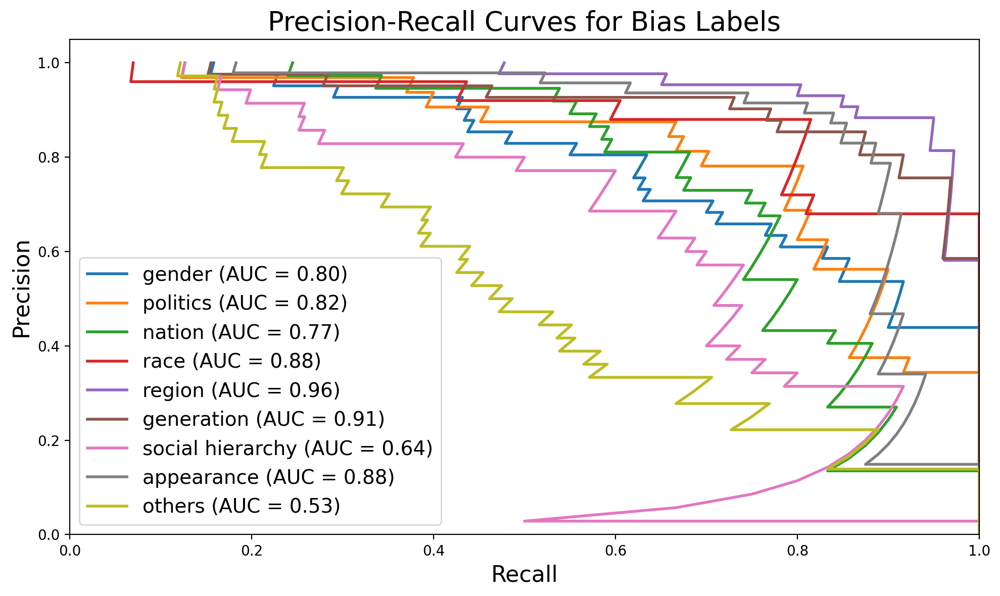


Eval results for Preference.
accuracy : 71.78
f1-macro : 72.03
preference_mae:0.3193069306930693
preference_top2_accuracy:0.9282178282737732
preference_top2_f1:0.6333322717804875

Eval results for Slang.
accuracy : 93.32
precision : 93.2
recall : 93.66
f1 : 93.43
matthews_corrcoef : 86.63
pr_auc : 0.9829696299604904
roc_auc : 0.9827674960166686

Eval results for Gender.
accuracy : 93.07
precision : 62.75
recall : 78.05
f1 : 69.57
matthews_corrcoef : 66.21
pr_auc : 0.7969821985334636
roc_auc : 0.9473224484310959

Eval results for Politic.
accuracy : 95.79
precision : 71.43
recall : 78.12
f1 : 74.63
matthews_corrcoef : 72.42
pr_auc : 0.8201592964544157
roc_auc : 0.9632056451612904

Eval results for Nation.
accuracy : 94.31
precision : 65.22
recall : 81.08
f1 : 72.29
matthews_corrcoef : 69.67
pr_auc : 0.7684671653395098
roc_auc : 0.9677443110685617

Eval results for Race.
accuracy : 94.8
precision : 54.76
recall : 92.0
f1 : 68.66
matthews_corrcoef : 68.67
pr_auc : 0.8844610738932079
roc_

epoch: 15, train loss: 2.5864: 100%|█████████████████████████████████████| 3836/3836 [27:29<00:00,  2.33it/s]


Preference Accuracy per class
Class 1: 74.89%
Class 2: 65.86%
Class 3: 74.81%
Class 4: 73.68%
Class 5: 70.00%


epoch: 15, valid loss: 16.2555: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 12.21it/s]


Preference Accuracy per class
Class 1: 91.46%
Class 2: 62.82%
Class 3: 60.40%
Class 4: 68.12%
Class 5: 68.92%


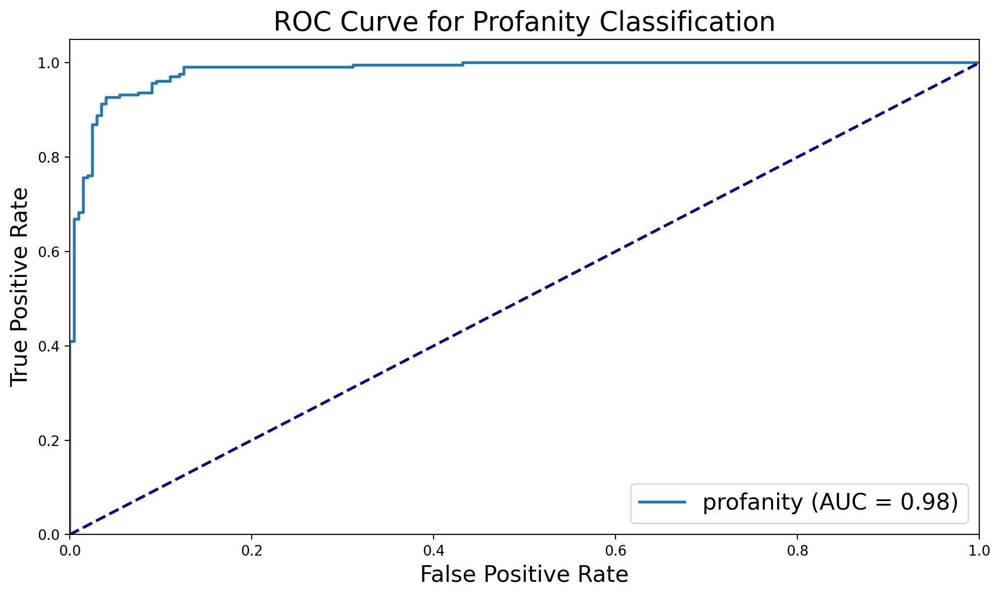

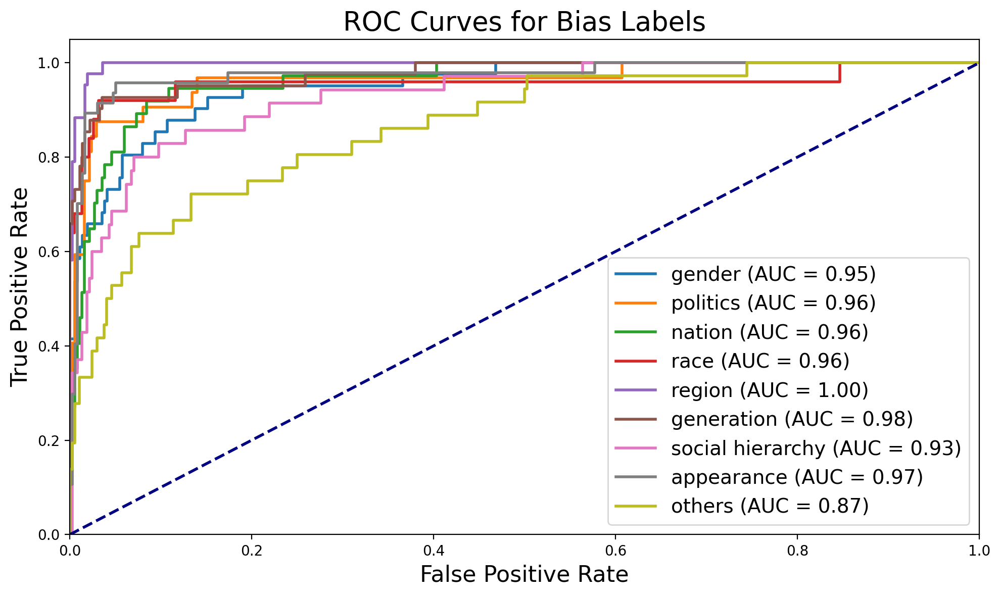

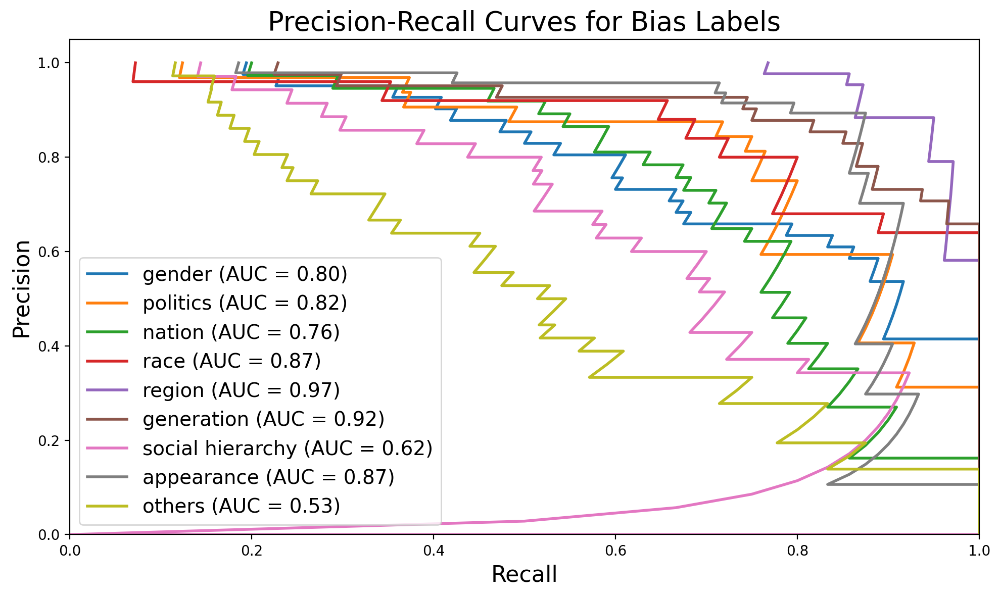


Eval results for Preference.
accuracy : 70.05
f1-macro : 70.05
preference_mae:0.33663366336633666
preference_top2_accuracy:0.9158415794372559
preference_top2_f1:0.6266266034945496

Eval results for Slang.
accuracy : 93.32
precision : 93.63
recall : 93.17
f1 : 93.4
matthews_corrcoef : 86.63
pr_auc : 0.982199358866896
roc_auc : 0.9826204191690159

Eval results for Gender.
accuracy : 92.57
precision : 60.38
recall : 78.05
f1 : 68.09
matthews_corrcoef : 64.64
pr_auc : 0.7984124186437052
roc_auc : 0.9519586104951958

Eval results for Politic.
accuracy : 96.53
precision : 75.0
recall : 84.38
f1 : 79.41
matthews_corrcoef : 77.69
pr_auc : 0.8224023661143038
roc_auc : 0.9631216397849461

Eval results for Nation.
accuracy : 94.31
precision : 66.67
recall : 75.68
f1 : 70.89
matthews_corrcoef : 67.91
pr_auc : 0.7587399806426715
roc_auc : 0.9619265041608366

Eval results for Race.
accuracy : 95.79
precision : 60.53
recall : 92.0
f1 : 73.02
matthews_corrcoef : 72.67
pr_auc : 0.869009854408037
roc_a

epoch: 16, train loss: 2.3118: 100%|█████████████████████████████████████| 3836/3836 [27:24<00:00,  2.33it/s]


Preference Accuracy per class
Class 1: 76.71%
Class 2: 65.67%
Class 3: 75.10%
Class 4: 74.88%
Class 5: 72.18%


epoch: 16, valid loss: 17.2797: 100%|██████████████████████████████████████| 101/101 [00:08<00:00, 12.30it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 69.23%
Class 3: 65.35%
Class 4: 76.81%
Class 5: 60.81%


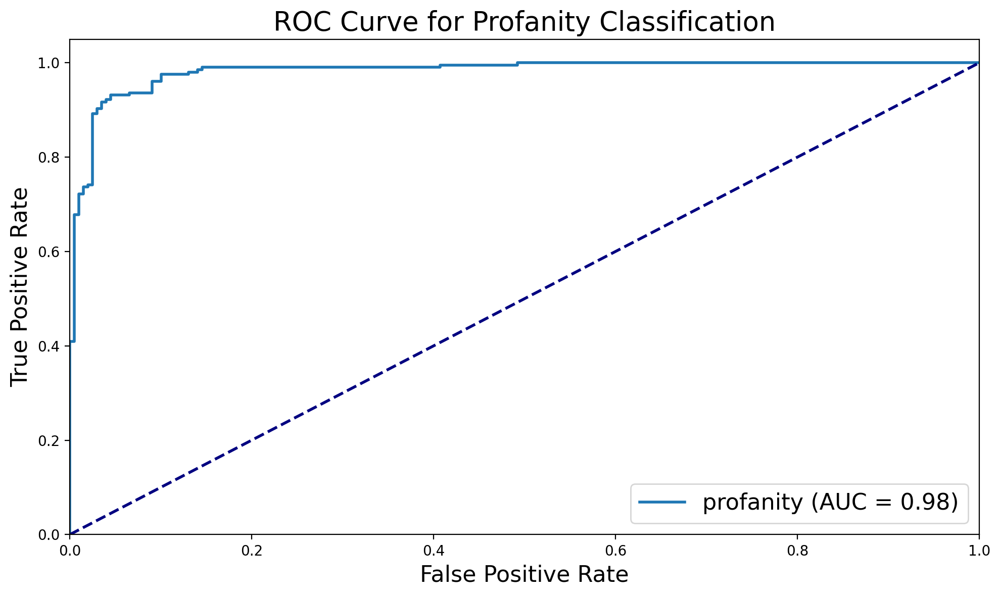

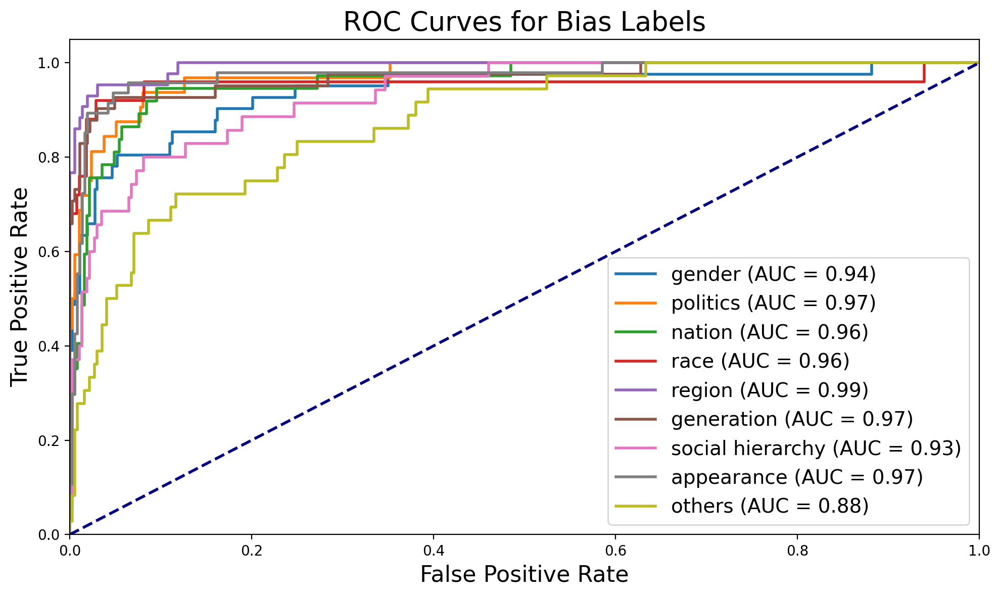

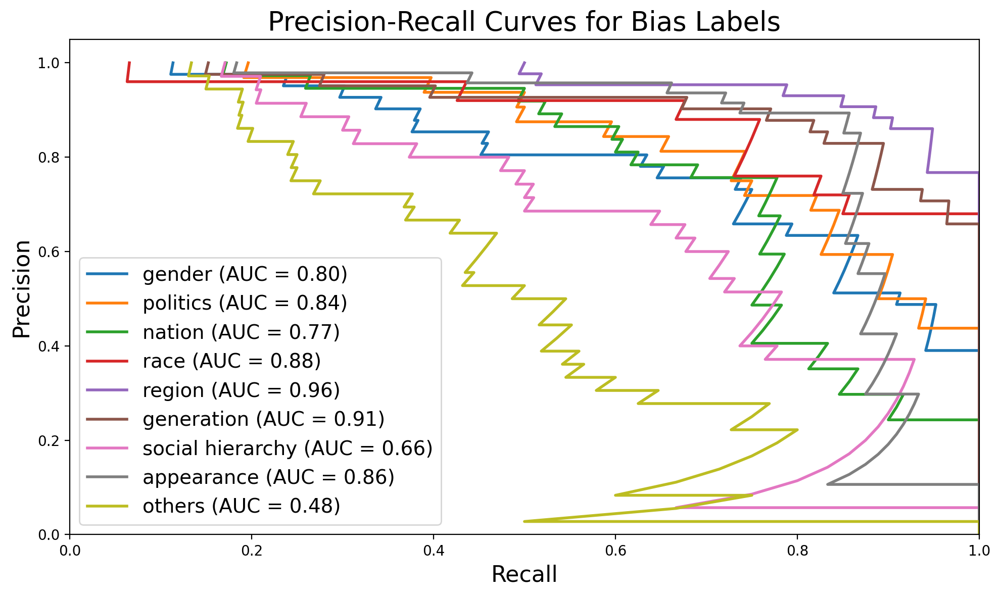


Eval results for Preference.
accuracy : 71.53
f1-macro : 71.76
preference_mae:0.3217821782178218
preference_top2_accuracy:0.9257425665855408
preference_top2_f1:0.6361952498034249

Eval results for Slang.
accuracy : 93.56
precision : 93.66
recall : 93.66
f1 : 93.66
matthews_corrcoef : 87.13
pr_auc : 0.9822253475614131
roc_auc : 0.9822282142419415

Eval results for Gender.
accuracy : 93.81
precision : 67.39
recall : 75.61
f1 : 71.26
matthews_corrcoef : 67.95
pr_auc : 0.796583965034592
roc_auc : 0.9383188873211045

Eval results for Politic.
accuracy : 95.54
precision : 68.42
recall : 81.25
f1 : 74.29
matthews_corrcoef : 72.18
pr_auc : 0.8417055209166616
roc_auc : 0.9730342741935483

Eval results for Nation.
accuracy : 94.55
precision : 68.29
recall : 75.68
f1 : 71.79
matthews_corrcoef : 68.9
pr_auc : 0.7747150593363301
roc_auc : 0.9602327122763091

Eval results for Race.
accuracy : 96.04
precision : 62.16
recall : 92.0
f1 : 74.19
matthews_corrcoef : 73.76
pr_auc : 0.8831296908716186
roc_

epoch: 17, train loss: 2.1894: 100%|█████████████████████████████████████| 3836/3836 [24:36<00:00,  2.60it/s]


Preference Accuracy per class
Class 1: 77.35%
Class 2: 65.88%
Class 3: 75.28%
Class 4: 76.44%
Class 5: 76.91%


epoch: 17, valid loss: 19.1894: 100%|██████████████████████████████████████| 101/101 [00:07<00:00, 13.98it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 65.38%
Class 3: 69.31%
Class 4: 73.91%
Class 5: 60.81%


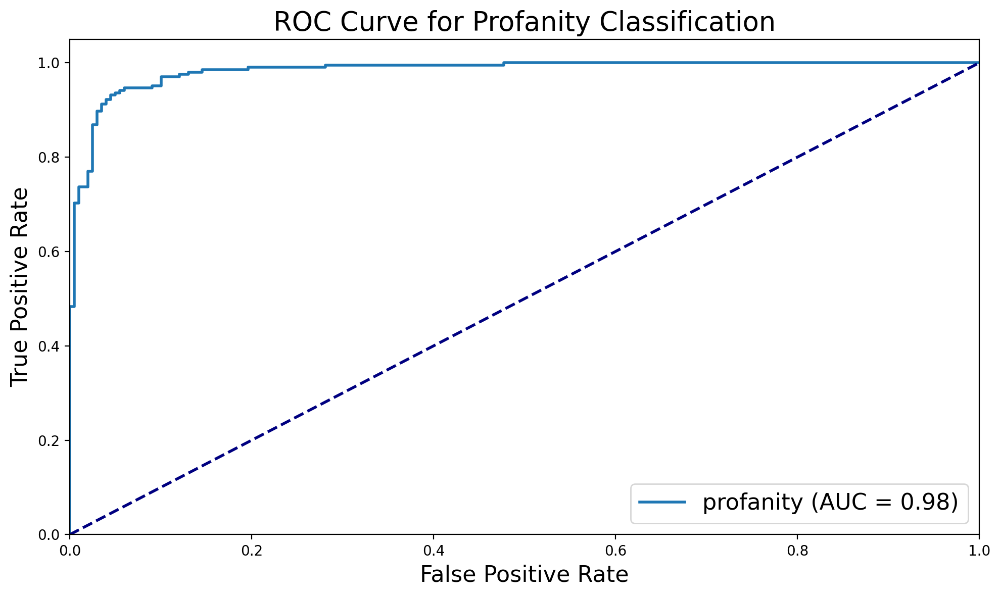

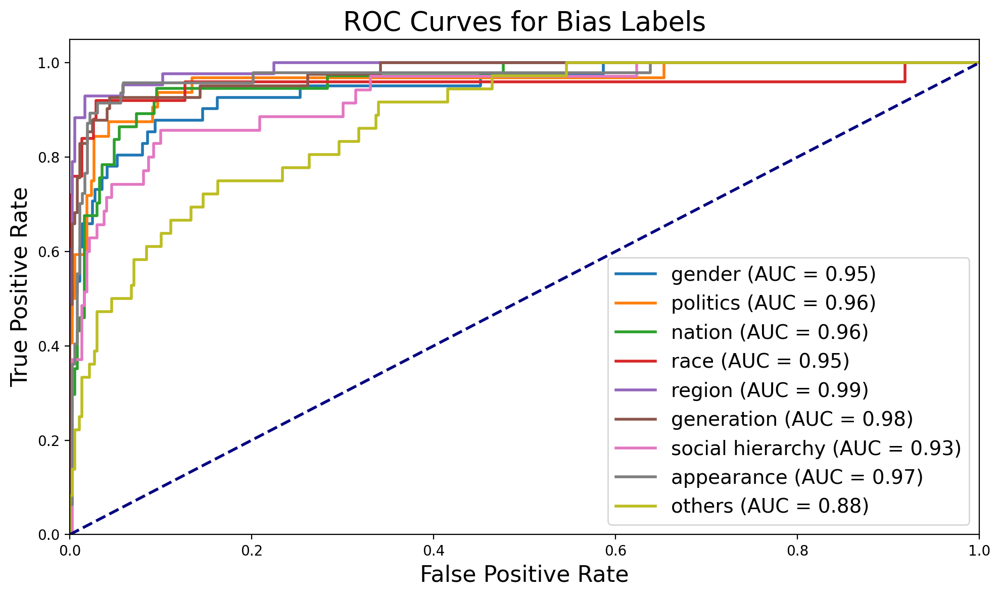

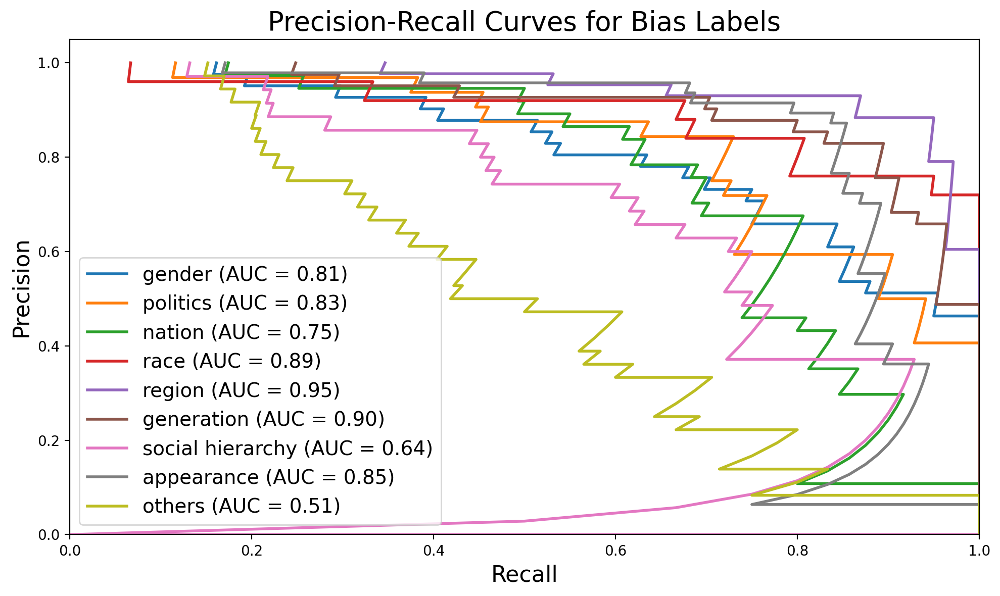


Eval results for Preference.
accuracy : 71.53
f1-macro : 71.58
preference_mae:0.32673267326732675
preference_top2_accuracy:0.9306930899620056
preference_top2_f1:0.6423525149100007

Eval results for Slang.
accuracy : 94.06
precision : 95.02
recall : 93.17
f1 : 94.09
matthews_corrcoef : 88.14
pr_auc : 0.9836475782745369
roc_auc : 0.9833803162152225

Eval results for Gender.
accuracy : 93.07
precision : 62.26
recall : 80.49
f1 : 70.21
matthews_corrcoef : 67.06
pr_auc : 0.8124597015099988
roc_auc : 0.9477927837129612

Eval results for Politic.
accuracy : 95.54
precision : 71.88
recall : 71.88
f1 : 71.88
matthews_corrcoef : 69.46
pr_auc : 0.8251479239703595
roc_auc : 0.9617775537634409

Eval results for Nation.
accuracy : 94.55
precision : 69.23
recall : 72.97
f1 : 71.05
matthews_corrcoef : 68.08
pr_auc : 0.7548621873436541
roc_auc : 0.9594226378967523

Eval results for Race.
accuracy : 96.29
precision : 63.89
recall : 92.0
f1 : 75.41
matthews_corrcoef : 74.9
pr_auc : 0.8918720251635206
ro

epoch: 18, train loss: 2.1316: 100%|█████████████████████████████████████| 3836/3836 [23:04<00:00,  2.77it/s]


Preference Accuracy per class
Class 1: 78.00%
Class 2: 67.21%
Class 3: 75.80%
Class 4: 78.57%
Class 5: 77.45%


epoch: 18, valid loss: 18.3725: 100%|██████████████████████████████████████| 101/101 [00:07<00:00, 14.26it/s]


Preference Accuracy per class
Class 1: 85.37%
Class 2: 66.67%
Class 3: 66.34%
Class 4: 72.46%
Class 5: 66.22%


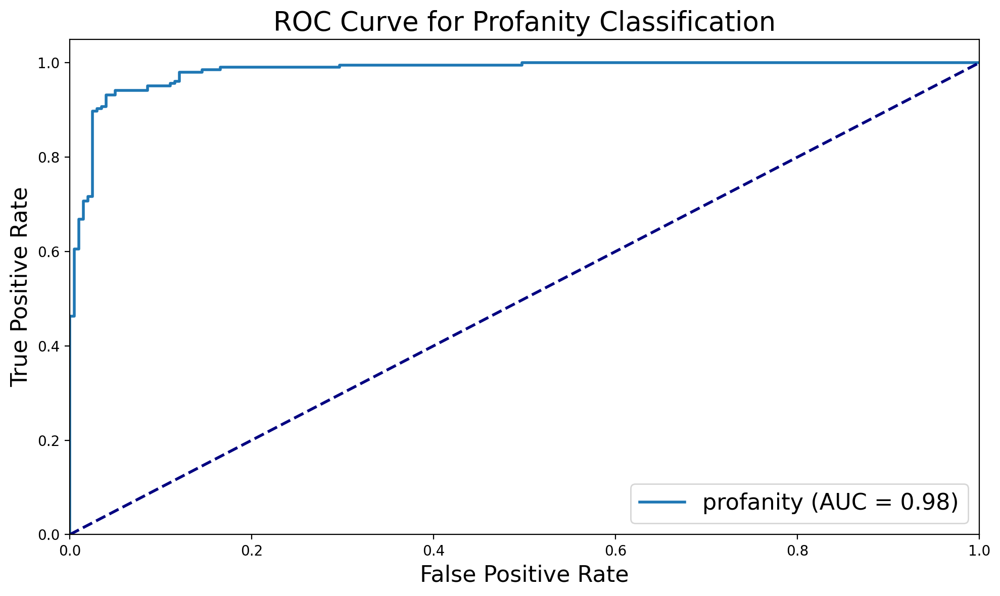

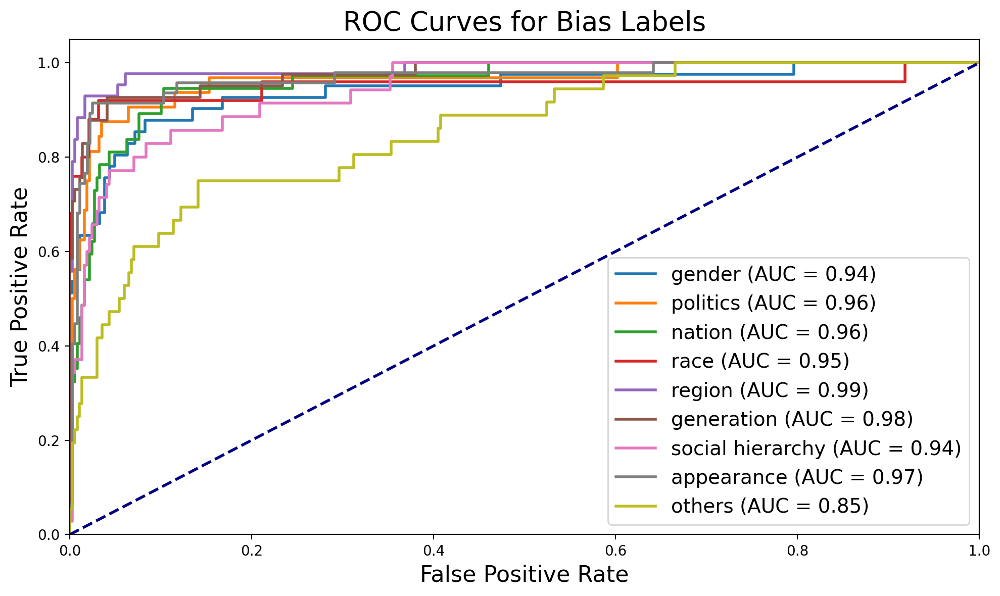

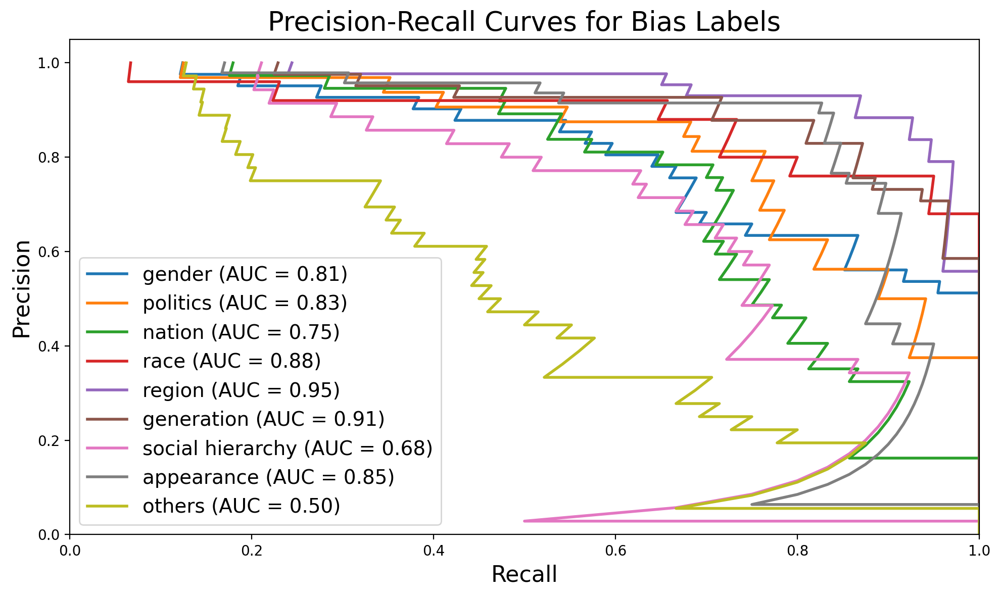


Eval results for Preference.
accuracy : 71.29
f1-macro : 71.7
preference_mae:0.3341584158415842
preference_top2_accuracy:0.9257425665855408
preference_top2_f1:0.6398431910688317

Eval results for Slang.
accuracy : 94.31
precision : 95.05
recall : 93.66
f1 : 94.35
matthews_corrcoef : 88.62
pr_auc : 0.9816845629673239
roc_auc : 0.9818605221228092

Eval results for Gender.
accuracy : 93.07
precision : 62.26
recall : 80.49
f1 : 70.21
matthews_corrcoef : 67.06
pr_auc : 0.8129733190363941
roc_auc : 0.941947188066922

Eval results for Politic.
accuracy : 95.79
precision : 70.27
recall : 81.25
f1 : 75.36
matthews_corrcoef : 73.31
pr_auc : 0.83014222117196
roc_auc : 0.9637936827956989

Eval results for Nation.
accuracy : 94.8
precision : 70.0
recall : 75.68
f1 : 72.73
matthews_corrcoef : 69.92
pr_auc : 0.7545147163879298
roc_auc : 0.9590544222696811

Eval results for Race.
accuracy : 96.29
precision : 64.71
recall : 88.0
f1 : 74.58
matthews_corrcoef : 73.62
pr_auc : 0.8833311000587653
roc_auc 

epoch: 19, train loss: 2.0286: 100%|█████████████████████████████████████| 3836/3836 [22:54<00:00,  2.79it/s]


Preference Accuracy per class
Class 1: 77.59%
Class 2: 67.65%
Class 3: 76.13%
Class 4: 80.88%
Class 5: 78.91%


epoch: 19, valid loss: 18.302: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 14.12it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 69.23%
Class 3: 60.40%
Class 4: 73.91%
Class 5: 60.81%


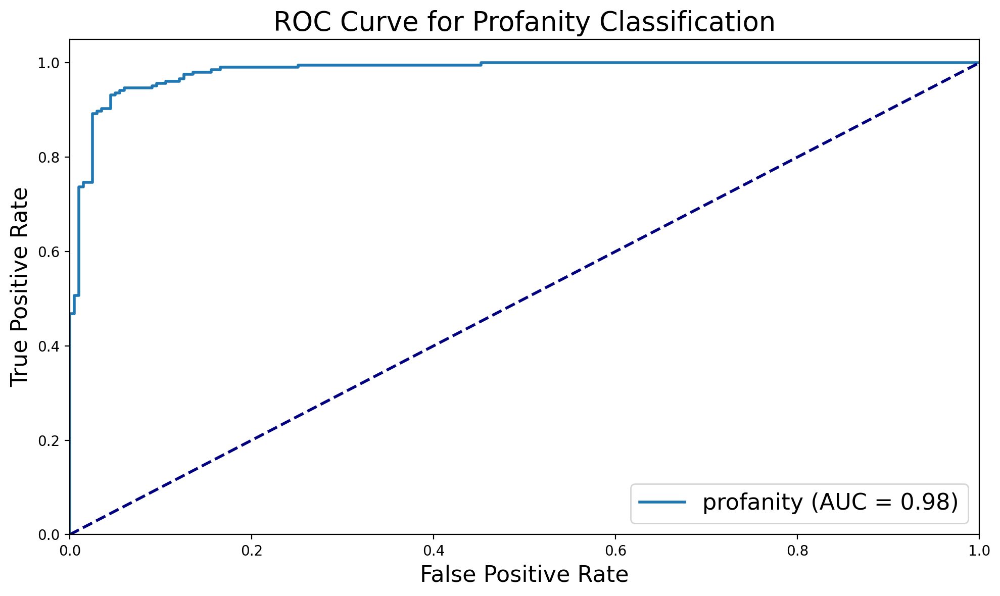

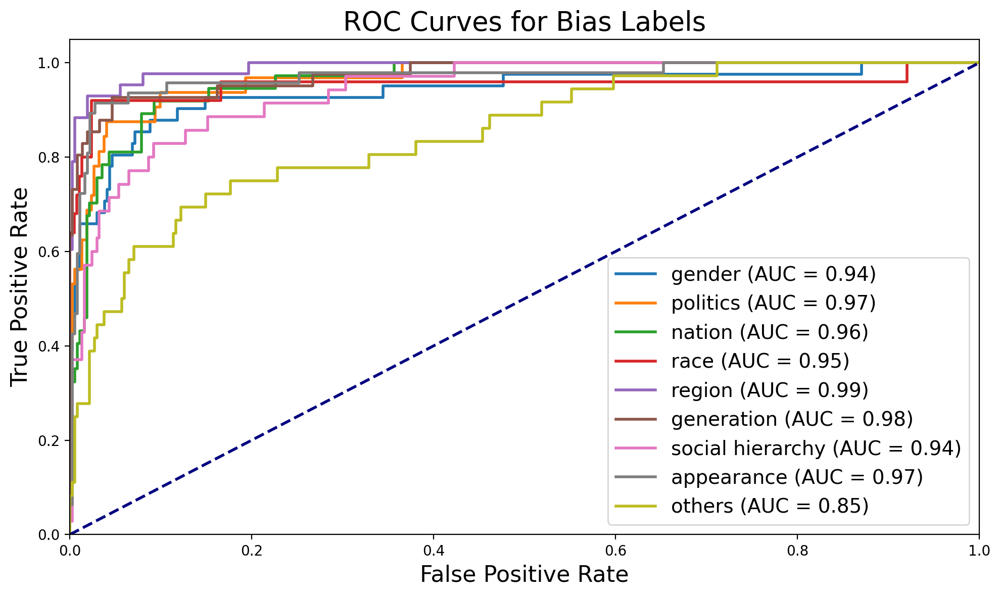

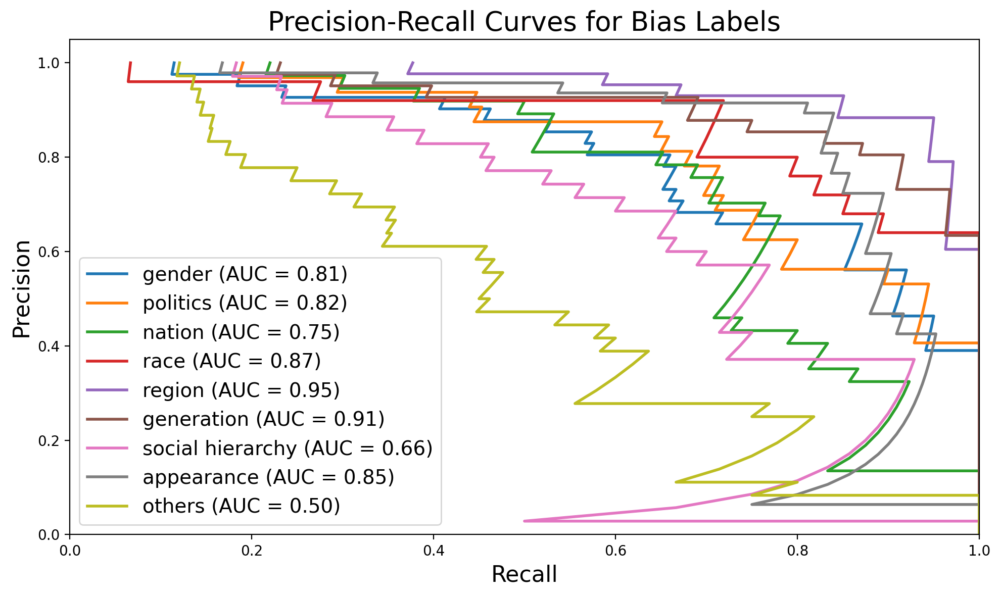


Eval results for Preference.
accuracy : 69.8
f1-macro : 69.98
preference_mae:0.3465346534653465
preference_top2_accuracy:0.9232673048973083
preference_top2_f1:0.6336577359780574

Eval results for Slang.
accuracy : 94.31
precision : 95.05
recall : 93.66
f1 : 94.35
matthews_corrcoef : 88.62
pr_auc : 0.9818437726248816
roc_auc : 0.9823262654737099

Eval results for Gender.
accuracy : 93.81
precision : 66.67
recall : 78.05
f1 : 71.91
matthews_corrcoef : 68.73
pr_auc : 0.805650159447242
roc_auc : 0.938856413357522

Eval results for Politic.
accuracy : 95.79
precision : 71.43
recall : 78.12
f1 : 74.63
matthews_corrcoef : 72.42
pr_auc : 0.8191700636164854
roc_auc : 0.9680779569892473

Eval results for Nation.
accuracy : 94.8
precision : 71.05
recall : 72.97
f1 : 72.0
matthews_corrcoef : 69.14
pr_auc : 0.7492061418285618
roc_auc : 0.9608955004050372

Eval results for Race.
accuracy : 96.04
precision : 62.16
recall : 92.0
f1 : 74.19
matthews_corrcoef : 73.76
pr_auc : 0.8725791210677262
roc_auc

epoch: 20, train loss: 1.8171: 100%|█████████████████████████████████████| 3836/3836 [23:00<00:00,  2.78it/s]


Preference Accuracy per class
Class 1: 79.14%
Class 2: 68.08%
Class 3: 76.28%
Class 4: 81.57%
Class 5: 80.55%


epoch: 20, valid loss: 20.229: 100%|███████████████████████████████████████| 101/101 [00:07<00:00, 13.96it/s]


Preference Accuracy per class
Class 1: 82.93%
Class 2: 66.67%
Class 3: 69.31%
Class 4: 72.46%
Class 5: 64.86%


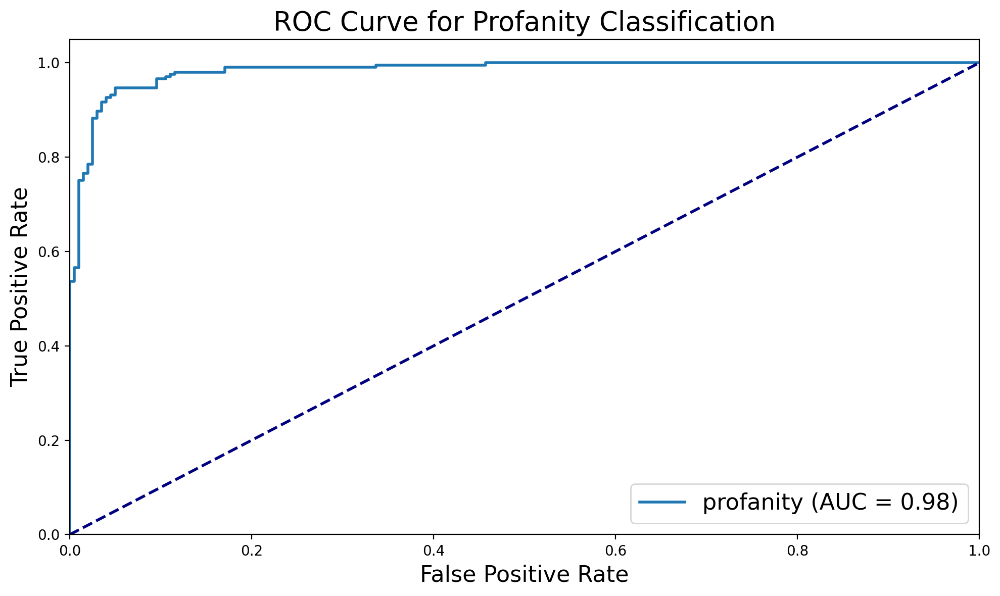

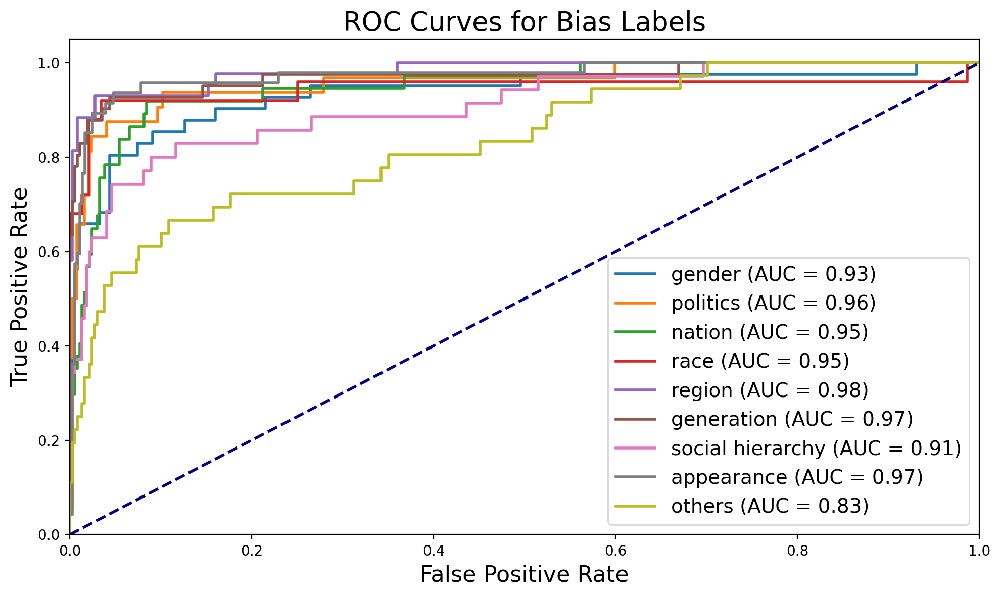

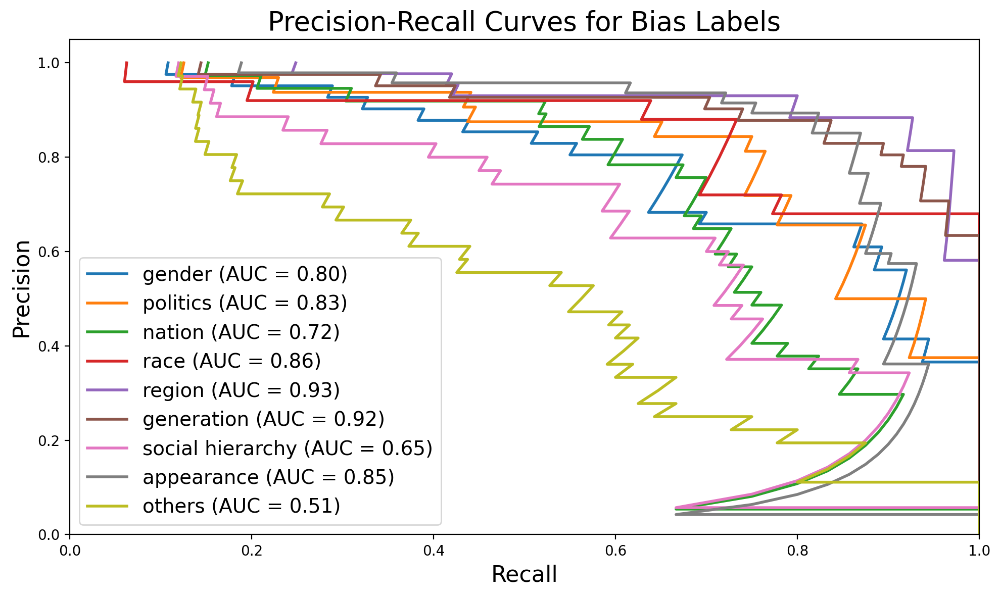


Eval results for Preference.
accuracy : 71.29
f1-macro : 71.55
preference_mae:0.32425742574257427
preference_top2_accuracy:0.9331682920455933
preference_top2_f1:0.6445851102568073

Eval results for Slang.
accuracy : 94.55
precision : 95.07
recall : 94.15
f1 : 94.61
matthews_corrcoef : 89.11
pr_auc : 0.9836829938521889
roc_auc : 0.9834293418311066

Eval results for Gender.
accuracy : 93.81
precision : 66.67
recall : 78.05
f1 : 71.91
matthews_corrcoef : 68.73
pr_auc : 0.7951763120528894
roc_auc : 0.9344218235570786

Eval results for Politic.
accuracy : 96.29
precision : 74.29
recall : 81.25
f1 : 77.61
matthews_corrcoef : 75.68
pr_auc : 0.827664853385911
roc_auc : 0.9596774193548387

Eval results for Nation.
accuracy : 94.55
precision : 72.73
recall : 64.86
f1 : 68.57
matthews_corrcoef : 65.73
pr_auc : 0.7167669866954707
roc_auc : 0.9494808159658296

Eval results for Race.
accuracy : 97.03
precision : 72.41
recall : 84.0
f1 : 77.78
matthews_corrcoef : 76.44
pr_auc : 0.8610449217035298
ro

In [21]:
train_losses = []
val_f1 = []
val_roc_auc= []
val_accuracy = []
val_mae = []
val_top2_acc = []
val_top2_f1 = []
val_pr_auc = []
best_avg_score = 0

if config.do_train:
    best_score = [0] * 11
    # Start training over a number of epochs
    for epoch in range(config.num_train_epochs):
        train_results = run_epoch(loader=train_dataloader, epoch=epoch, is_train=True, **params)
        train_loss = train_results['loss']
        train_losses.append(train_loss)
        
        # Optionally evaluate model during training
        if config.do_eval_during_train:
            eval_results = do_eval(epoch)
            
            # Store evaluation metrics
            val_f1.append(tuple(eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)))
            val_roc_auc.append(tuple(eval_results[i]["roc_auc"] for i in range(1, 11)))
            val_accuracy.append(tuple(eval_results[i]["accuracy"] for i in range(11)))
            val_mae.append(eval_results[11])
            val_top2_acc.append(eval_results[12])
            val_top2_f1.append(eval_results[13])
            val_pr_auc.append(tuple(eval_results[-10:]))
            
            # Check and store best model based on average F1 score
            current_score = [eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)]
            current_avg_score = sum(current_score) / len(current_score)  
            if current_avg_score >= best_avg_score:
                best_avg_score = current_avg_score
                output_dir = os.path.join(config.output_dir, config.task, config.dataset, f"{epoch}-best-ckpt")
                # Save best model
                copy.deepcopy(
                    model_dp.module if hasattr(model_dp, "module") else model_dp._models[0] if hasattr(model_dp, "_models") else model_dp
                ).cpu().save_pretrained(output_dir)
                # Save configuration of best model
                with open(os.path.join(output_dir, "finetune_config.json"), "w") as save_config:
                    json.dump(vars(config), save_config, sort_keys=True, indent=4)
                print(f"Checkpoint {output_dir} saved.")             

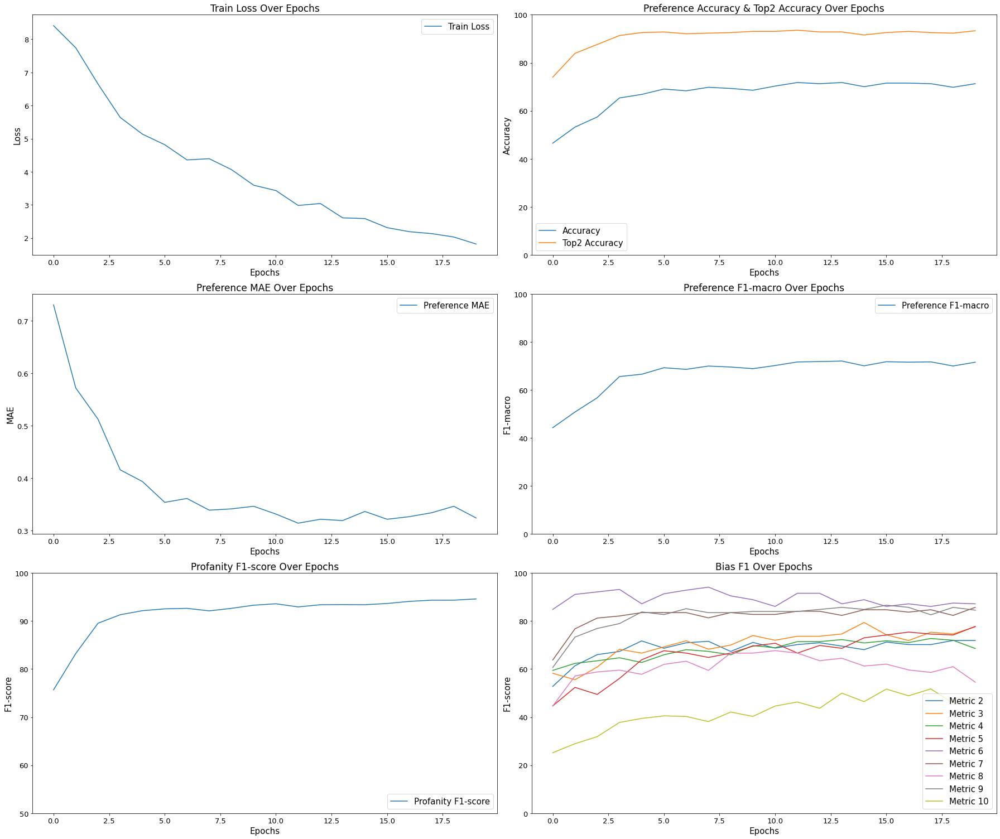

In [24]:
import numpy as npii
import matplotlib.pyplot as plt

# Create a 3x2 grid for the subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(25, 21))

# 1. Train Loss Over Epochs
axs[0, 0].plot(train_losses, label='Train Loss')
axs[0, 0].set_xlabel('Epochs', fontsize=15)
axs[0, 0].set_ylabel('Loss', fontsize=15)
axs[0, 0].set_title('Train Loss Over Epochs', fontsize=17)
axs[0, 0].legend(fontsize=15)
axs[0, 0].tick_params(axis='both', labelsize=13)
axs[0, 0].grid(False)

# 2. Preference Accuracy & Top2 Accuracy Over Epochs
val_accuracy = np.array(val_accuracy)
val_top2_accuracy = np.array(val_top2_acc) * 100
axs[0, 1].plot(val_accuracy[:, 0], label='Accuracy', linestyle='-')
axs[0, 1].plot(val_top2_accuracy, label='Top2 Accuracy', linestyle='-')
axs[0, 1].set_xlabel('Epochs', fontsize=15)
axs[0, 1].set_ylabel('Accuracy', fontsize=15)
axs[0, 1].set_ylim(0, 100)
axs[0, 1].set_title('Preference Accuracy & Top2 Accuracy Over Epochs', fontsize=17)
axs[0, 1].legend(fontsize=15)
axs[0, 1].tick_params(axis='both', labelsize=13)
axs[0, 1].grid(False)

# 3. Preference MAE Over Epochs
val_mae = np.array(val_mae)
axs[1, 0].plot(val_mae, label='Preference MAE', linestyle='-')
axs[1, 0].set_xlabel('Epochs', fontsize=15)
axs[1, 0].set_ylabel('MAE', fontsize=15)
axs[1, 0].set_title('Preference MAE Over Epochs', fontsize=17)
axs[1, 0].legend(fontsize=15)
axs[1, 0].tick_params(axis='both', labelsize=13)
axs[1, 0].grid(False)

# 4. Preference F1-macro Over Epochs
result = [val_f1[i][0] for i in range(config.num_train_epochs)]
axs[1, 1].plot(result, label='Preference F1-macro', linestyle='-')
axs[1, 1].set_xlabel('Epochs', fontsize=15)
axs[1, 1].set_ylabel('F1-macro', fontsize=15)
axs[1, 1].set_ylim(0, 100)
axs[1, 1].set_title('Preference F1-macro Over Epochs', fontsize=17)
axs[1, 1].legend(fontsize=15)
axs[1, 1].tick_params(axis='both', labelsize=13)
axs[1, 1].grid(False)

# 5. Profanity Metrics Over Epochs
result = [val_f1[i][1] for i in range(config.num_train_epochs)]
axs[2, 0].plot(result, label='Profanity F1-score', linestyle='-')
axs[2, 0].set_xlabel('Epochs', fontsize=15)
axs[2, 0].set_ylabel('F1-score', fontsize=15)
axs[2, 0].set_ylim(50, 100)
axs[2, 0].set_title('Profanity F1-score Over Epochs', fontsize=17)
axs[2, 0].legend(loc="lower right", fontsize=15)
axs[2, 0].tick_params(axis='both', labelsize=13)
axs[2, 0].grid(False)

# 6. Bias F1-score Over Epochs
for j in range(2, 11):
    result = [val_f1[i][j] for i in range(config.num_train_epochs)]
    axs[2, 1].plot(result, label=f'Metric {j}', linestyle='-')
    axs[2, 1].set_xlabel('Epochs', fontsize=15)
    axs[2, 1].set_ylabel('F1-score', fontsize=15)
    axs[2, 1].set_ylim(0, 100)
    axs[2, 1].set_title('Bias F1 Over Epochs', fontsize=17)
    axs[2, 1].legend(loc="lower right", fontsize=15)
    axs[2, 1].tick_params(axis='both', labelsize=13)
    axs[2, 1].grid(False)

plt.tight_layout()
#plt.savefig('combined_plots.pdf', format='pdf')
plt.show()